# Espinardo FIBa

#### FIBa measurements @ Espinardo campus

- Sample C: 10^17 molecules /cm3
- Sample a: not chelated

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
plt.rcParams["figure.figsize"] = 10, 8
plt.rcParams["font.size"     ] = 14

In [2]:
from IPython.display import Image as IM
from IPython.display import Math
from IPython.display import Latex

In [3]:
from PIL import Image, ImageFilter

In [4]:
import os
import sys
import glob
import time
import warnings
import datetime 
print("Last updated on ", time.asctime())

Last updated on  Wed May 15 10:34:57 2019


In [5]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import tables            as tb
import random
import glob
import warnings
sns.set()

In [34]:
from sabat.sbt_espinardo import get_jpeg_dirs
from sabat.sbt_espinardo import get_files
from sabat.sbt_espinardo import read_xls_files
from sabat.sbt_espinardo import sort_by_list
from sabat.sbt_espinardo import sort_files
from sabat.sbt_espinardo import load_LIVE_images
from sabat.sbt_espinardo import expo_seed
from sabat.sbt_espinardo import  get_live_dirs
from sabat.sbt_espinardo import get_profile
from sabat.sbt_espinardo import display_profile
from sabat.sbt_espinardo import display_profiles_before_after
from sabat.sbt_espinardo import plot_LIVE_images
from sabat.sbt_espinardo import plot_LIVE_avg
from sabat.sbt_espinardo import plot_avg_intensity
from sabat.sbt_espinardo import plot_total_intensity
from sabat.sbt_espinardo import avg_intensity
from sabat.sbt_espinardo import total_intensity
from sabat.sbt_espinardo import plot_TOM
from sabat.sbt_espinardo import get_TOM_files
from sabat.sbt_espinardo import display_profiles
from sabat.sbt_espinardo import show_toms
from sabat.sbt_espinardo import mean_and_std_toms
from sabat.sbt_espinardo import tom_I, tom_mean_I
from sabat.sbt_espinardo import fit_intensity, tom_I_max

In [7]:
import invisible_cities.core.fit_functions  as     fitf
from  invisible_cities.core.system_of_units import *

In [8]:
from sabat.sbt_types import FoV, CircularFoV, Monolayer
from sabat.sbt_types import Laser, PulsedLaser, GLaser, GaussianBeam
from sabat.sbt_types import Molecule
from sabat.sbt_types import Molecule2P
from sabat.sbt_types import DyeSample
from sabat.sbt_types import Microscope
from sabat.sbt_types import CCD
from sabat.sbt_core import  power_density
from sabat.sbt_core import  photon_density
from sabat.sbt_core import  fluorescence_per_molecule
from sabat.sbt_core import  duration_of_fluorescence
from sabat.sbt_core import  diffraction_limit
from sabat.sbt_core import  photoelectrons_per_pixel
from sabat.sbt_core import  fluorescence_2p_gb
from sabat.sbt_core import  fluorescence_2p_dl
from sabat.sbt_core import  absorbed_photons_per_fluorophore_per_pulse_2p
from sabat.sbt_types import  photon, molecule, GM, us, ucm2, ucm3, gp 

In [9]:
from sabat.sbt_core  import  FIB 
from sabat.sbt_core  import  FLUO3
from sabat.sbt_core import  Setup

## Sample a FIB

In [17]:
path = '/Users/jjgomezcadenas/Projects/Development/data/2Photon/'

In [18]:
ipath = os.path.join(path, 'sample_a_FIB_series2')
print(ipath)

/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2


### TOM files

In [19]:
TOM = get_TOM_files(ipath)
print(list(TOM.keys()))

['TOMO00_800nm_8mW_S1_2micbefore8mW', 'TOMO00_800nm_55mW_S1_2micbefore55mW', 'TOMO00_800nm_15mW_S1_2micafter15mW', 'TOMO00_800nm_45mW_S1_2micafter45mW', 'TOMO00_800nm_35mW_S1_2micbefore35mW', 'TOMO00_800nm_25mW_S1_2micafter25mW', 'TOMO00_800nm_30mW_S1_2micbefore30mW', 'TOMO00_800nm_30mW_S1_2micafter30mW', 'TOMO00_800nm_22mW_S1_2micafter22mW', 'TOMO00_800nm_8mW_S1_2micafter8mW', 'TOMO00_800nm_55mW_S1_2micafter55mW', 'TOMO00_800nm_25mW_S1_2micbefore25mW', 'TOMO00_800nm_18mW_S1_2micafter18mW', 'TOMO00_800nm_35mW_S1_2micafter35mW', 'TOMO00_800nm_18mW_S1_2micbefore18mW', 'TOMO00_800nm_15mW_S1_2micbefore15mW', 'TOMO00_800nm_22mW_S1_2micbefore22mW', 'TOMO00_800nm_45mW_S1_2micbefore45mW']


In [20]:
tom8mWb  = read_xls_files(TOM['TOMO00_800nm_8mW_S1_2micbefore8mW'])
tom8mWa  = read_xls_files(TOM['TOMO00_800nm_8mW_S1_2micafter8mW'])
tom15mWb  = read_xls_files(TOM['TOMO00_800nm_15mW_S1_2micbefore15mW'])
tom15mWa  = read_xls_files(TOM['TOMO00_800nm_15mW_S1_2micafter15mW'])

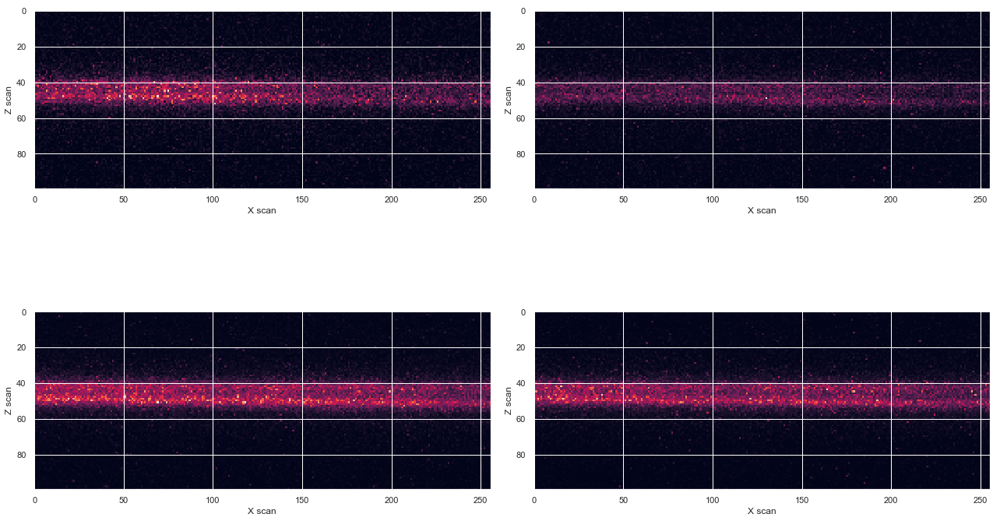

In [21]:
show_toms((tom8mWb, tom8mWa, tom15mWb, tom15mWa), nx = 2, ny =2, figsize=(18,12))

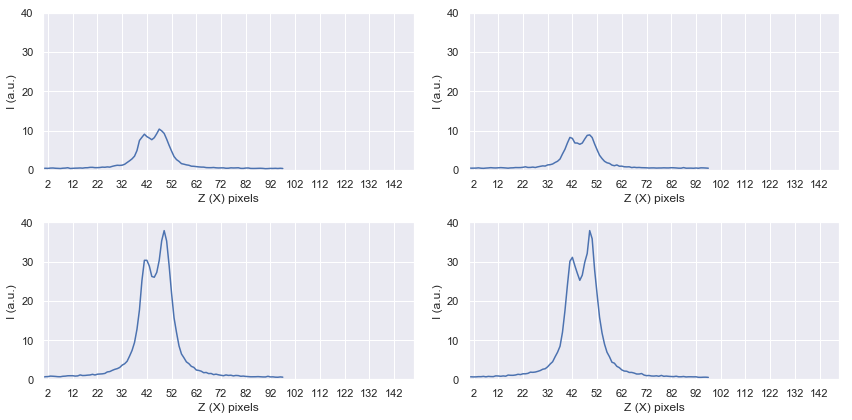

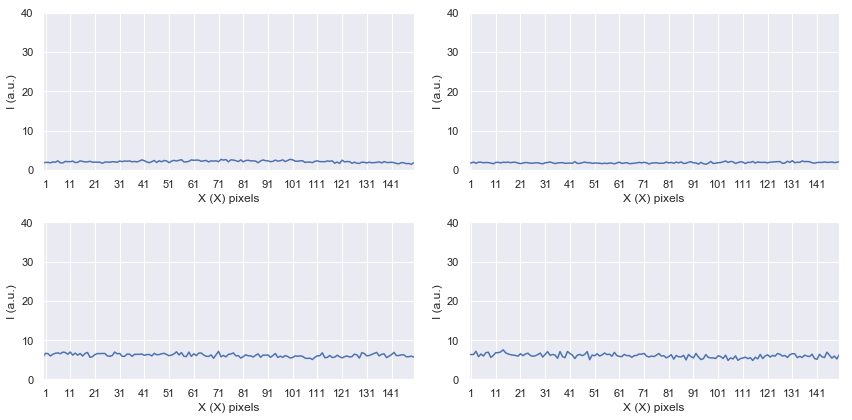

In [22]:
display_profiles((tom8mWb, tom8mWa, tom15mWb, tom15mWa), 
                 zrange=(0,150), yrange=(0,40), nx = 2, ny =2, figsize=(12,6))

In [23]:
tom25mWb  = read_xls_files(TOM['TOMO00_800nm_25mW_S1_2micbefore25mW'])
tom25mWa  = read_xls_files(TOM['TOMO00_800nm_25mW_S1_2micafter25mW'])
tom30mWb  = read_xls_files(TOM['TOMO00_800nm_30mW_S1_2micbefore30mW'])
tom30mWa  = read_xls_files(TOM['TOMO00_800nm_30mW_S1_2micafter30mW'])

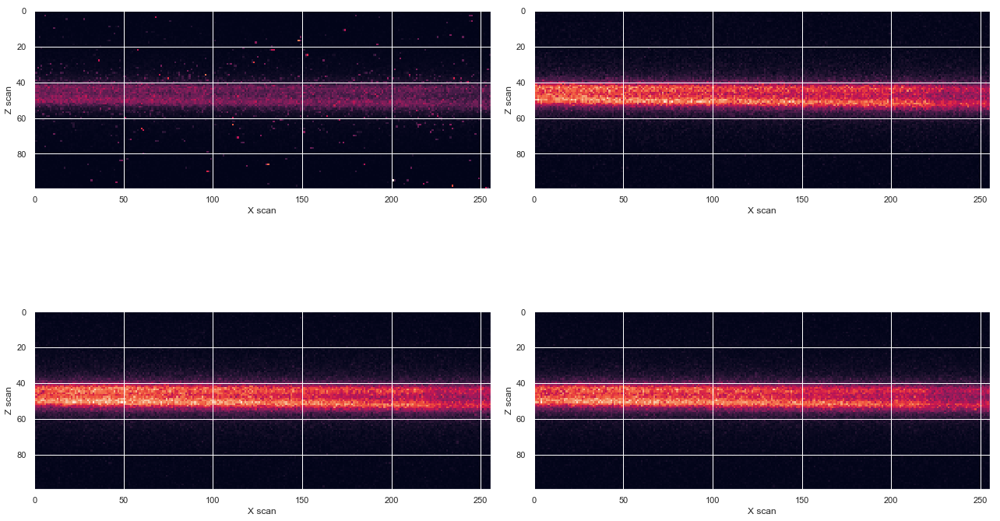

In [24]:
show_toms((tom25mWb, tom25mWa, tom30mWb, tom30mWa), nx = 2, ny =2, figsize=(18,12))

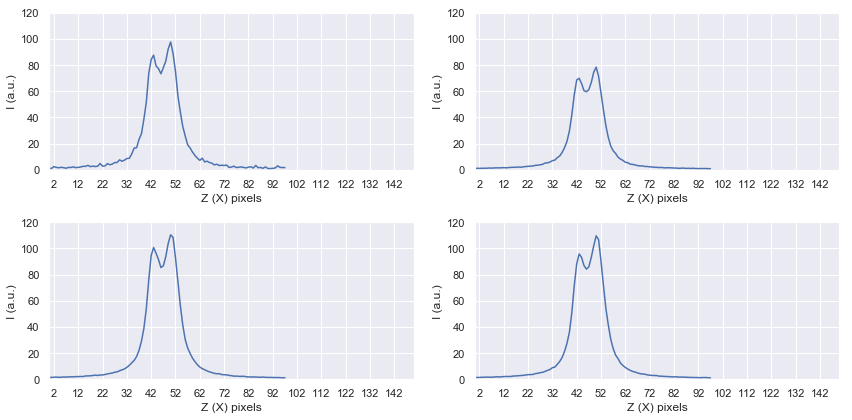

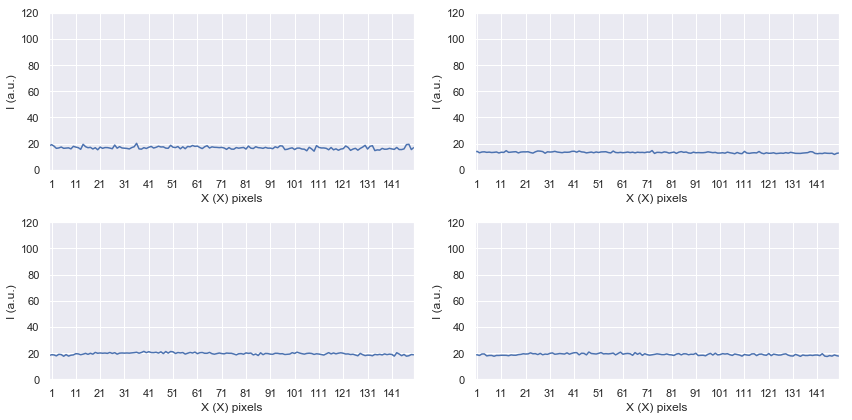

In [25]:
display_profiles((tom25mWb, tom25mWa, tom30mWb, tom30mWa), 
                 zrange=(0,150), yrange=(0,120), nx = 2, ny =2, figsize=(12,6))

In [26]:
tom35mWb  = read_xls_files(TOM['TOMO00_800nm_35mW_S1_2micbefore35mW'])
tom35mWa  = read_xls_files(TOM['TOMO00_800nm_35mW_S1_2micafter35mW'])
tom45mWb  = read_xls_files(TOM['TOMO00_800nm_45mW_S1_2micbefore45mW'])
tom45mWa  = read_xls_files(TOM['TOMO00_800nm_45mW_S1_2micafter45mW'])

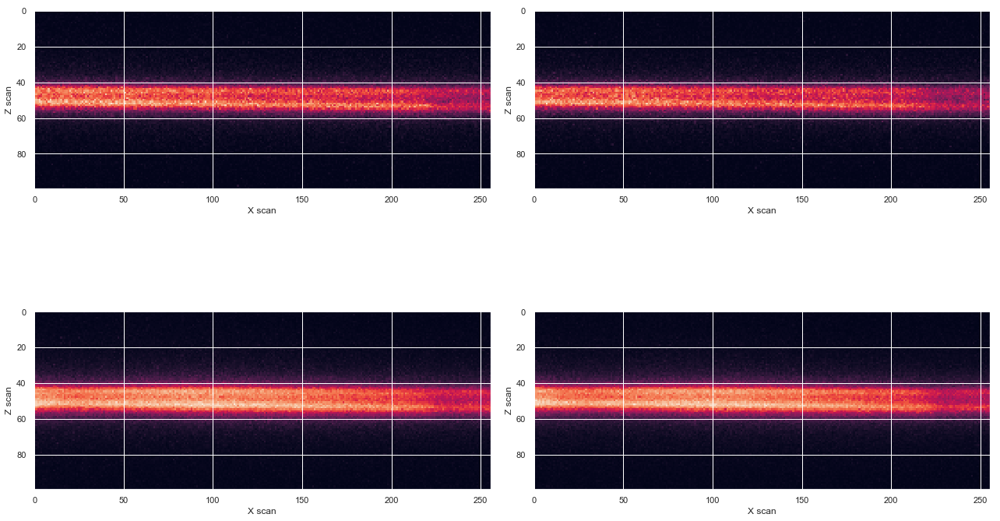

In [27]:
show_toms((tom35mWb, tom35mWa, tom45mWb, tom45mWa), nx = 2, ny =2, figsize=(18,12))

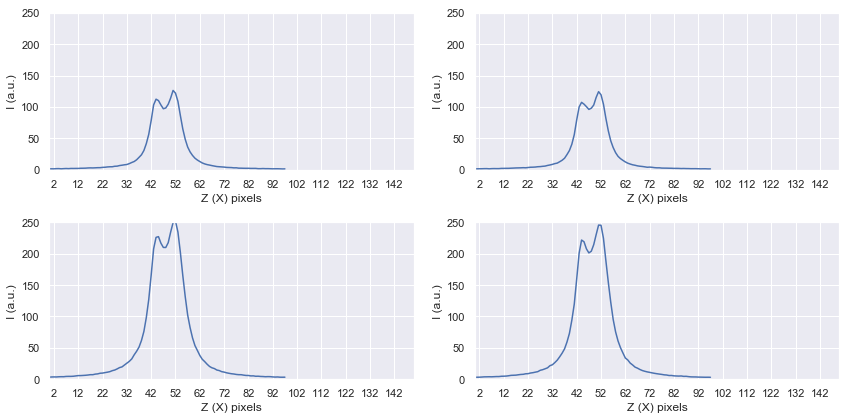

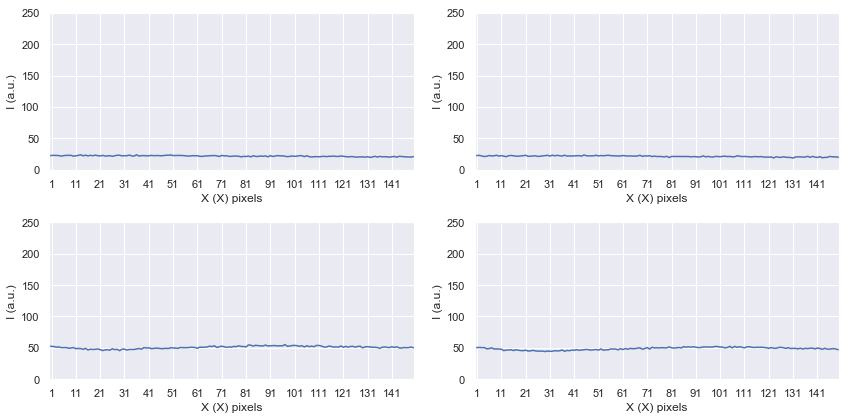

In [35]:
display_profiles((tom35mWb, tom35mWa, tom45mWb, tom45mWa), 
                 zrange=(0,150), yrange=(0,250), nx = 2, ny =2, figsize=(12,6))

In [36]:
tom22mWb  = read_xls_files(TOM['TOMO00_800nm_22mW_S1_2micbefore22mW'])
tom22mWa  = read_xls_files(TOM['TOMO00_800nm_22mW_S1_2micafter22mW'])
tom55mWb  = read_xls_files(TOM['TOMO00_800nm_55mW_S1_2micbefore55mW'])
tom55mWa  = read_xls_files(TOM['TOMO00_800nm_55mW_S1_2micafter55mW'])

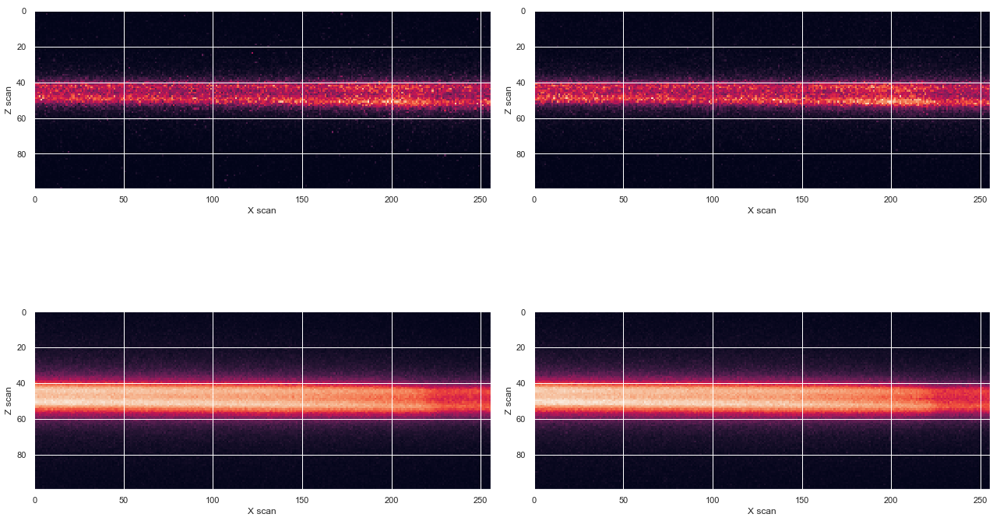

In [37]:
show_toms((tom22mWb, tom22mWa, tom55mWb, tom55mWa), nx = 2, ny =2, figsize=(18,12))

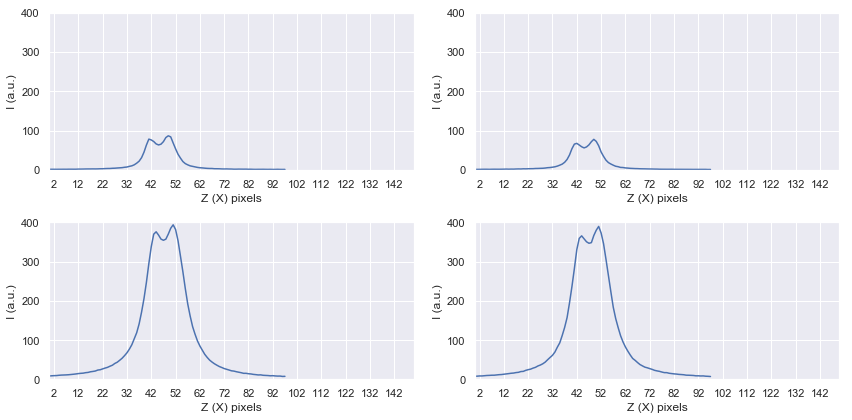

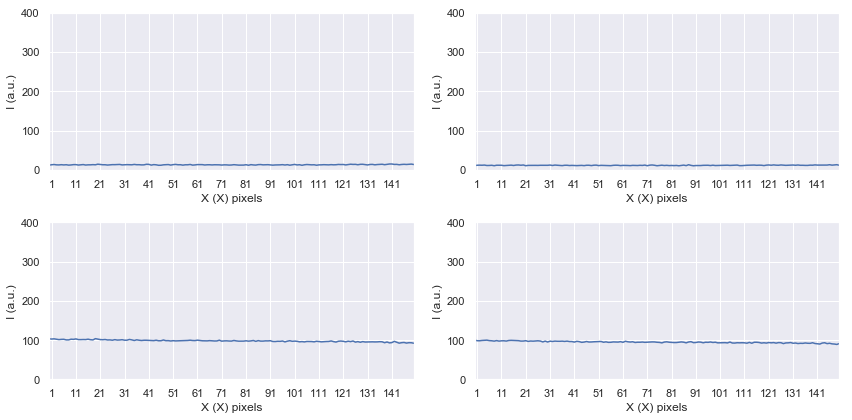

In [38]:
display_profiles((tom22mWb, tom22mWa, tom55mWb, tom55mWa), 
                 zrange=(0,150), yrange=(0,400), nx = 2, ny =2, figsize=(12,6))

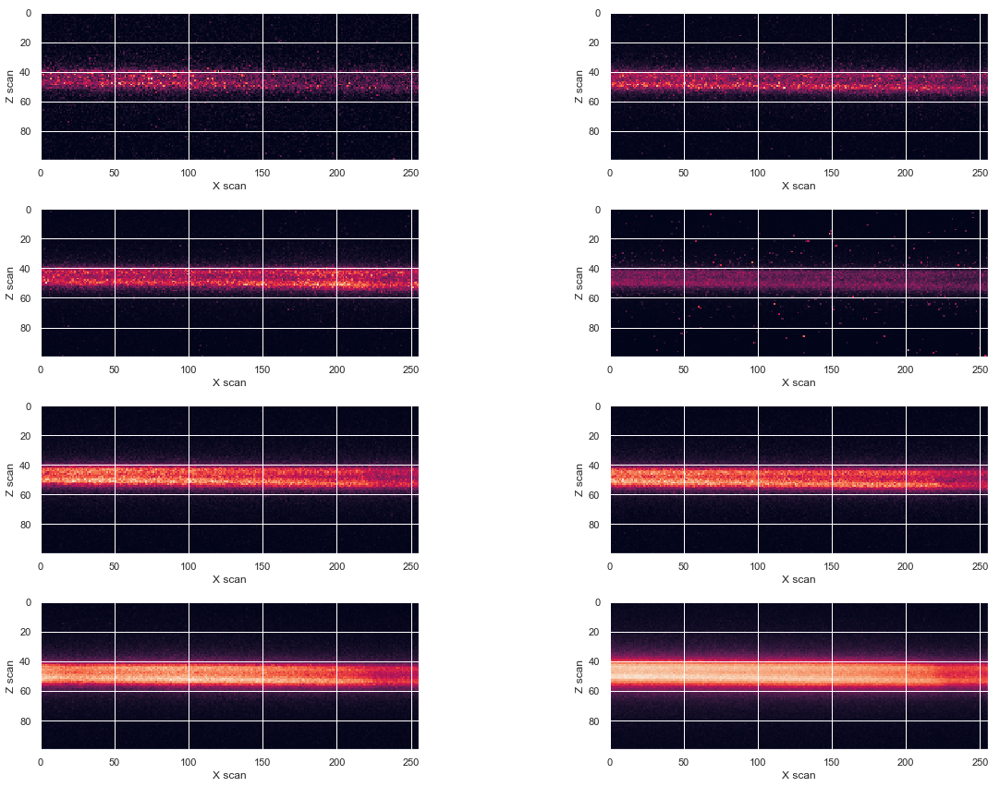

In [116]:
show_toms((tom8mWb, tom15mWb, tom22mWb, tom25mWb, tom30mWb,
          tom35mWb, tom45mWb, tom55mWb ), nx = 4, ny =2, figsize=(18,12))

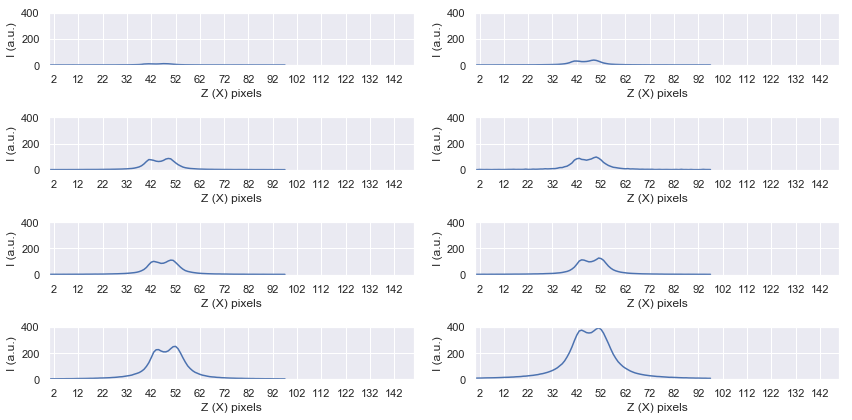

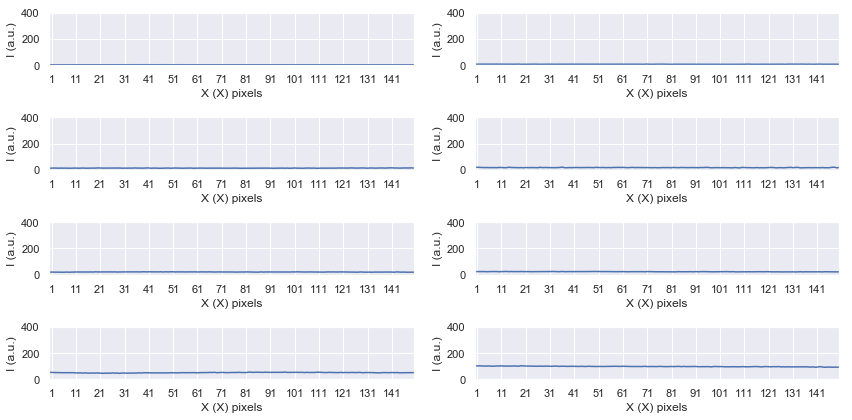

In [117]:
display_profiles((tom8mWb, tom15mWb, tom22mWb, tom25mWb, tom30mWb,
          tom35mWb, tom45mWb, tom55mWb), 
                 zrange=(0,150), yrange=(0,400), nx = 4, ny =2, figsize=(12,6))

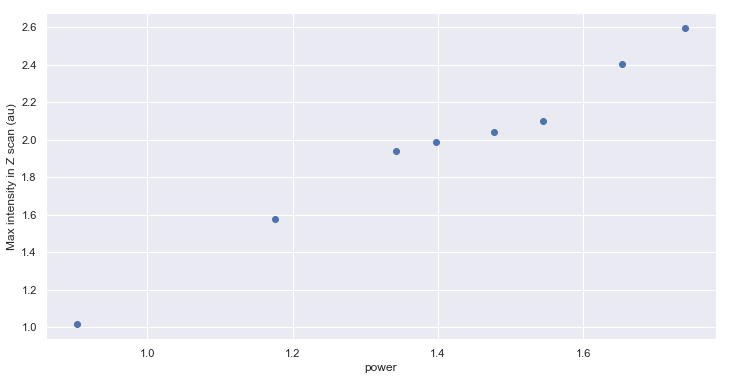

In [42]:
I = tom_I_max((tom8mWb, tom15mWb, tom22mWb, tom25mWb, tom30mWb,
          tom35mWb, tom45mWb, tom55mWb))

X = np.array([8,15,22,25,30,35,45,55])

fig     = plt.figure(figsize=(12,6))
ax      = fig.add_subplot(1, 1, 1)
plt.plot(np.log10(X), np.log10(I), 'bo')
plt.xlabel('power')
plt.ylabel('Max intensity in Z scan (au)')
plt.show()

### Fit first 3 points

In [48]:
lX = np.log10(X)
lI = np.log10(I)
print(lX[0:3], lI[0:3])
za    = np.polyfit(lX[0:3], lI[0:3], 1)

print(f'coefficients of poly fit: {za}')
fa      = np.poly1d(za)
fa

[0.90308999 1.17609126 1.34242268] [1.01533355 1.57821825 1.93721219]
coefficients of poly fit: [ 2.09475837 -0.87888982]


poly1d([ 2.09475837, -0.87888982])

### First last 3 points

In [51]:
print(lX[5:8], lI[5:8])
zb    = np.polyfit(lX[5:8], lI[5:8], 1)

print(f'coefficients of poly fit: {zb}')
fb      = np.poly1d(zb)
fb

[1.54406804 1.65321251 1.74036269] [2.10144633 2.40101665 2.59488006]
coefficients of poly fit: [ 2.52329343 -1.78725991]


poly1d([ 2.52329343, -1.78725991])

In [53]:
FA=np.array([fa(x) for x in lX])
FB=np.array([fb(x) for x in lX])

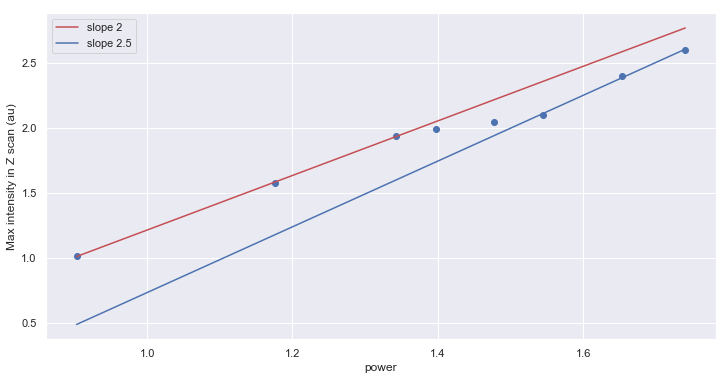

In [56]:
fig = plt.figure(figsize=(12,6))
ax  = fig.add_subplot(1, 1, 1)
    
plt.plot(np.log10(X), np.log10(I), 'bo')
plt.plot(lX, FA, 'r', label='slope 2')
plt.plot(lX, FB, 'b', label='slope 2.5')
plt.xlabel('power')
plt.ylabel('Max intensity in Z scan (au)')
ax.legend()
plt.show()

## Get LIVE directories

In [58]:
ipath

'/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2'

In [62]:
LIVE = get_live_dirs(path, sample='sample_a_FIB_series2')
list(LIVE.keys())

{'LIVE00_30mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_30mW_S1_TPEF/jpeg', 'LIVE00_55mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_55mW_S1_TPEF/jpeg', 'LIVE00_25mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_25mW_S1_TPEF/jpeg', 'LIVE00_8mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_8mW_S1_TPEF/jpeg', 'LIVE00_45mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_45mW_S1_TPEF/jpeg', 'LIVE00_15mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_15mW_S1_TPEF/jpeg', 'LIVE00_18mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_a_FIB_series2/LIVE00_800nm_18mW_S1_TPEF/jpeg', 'LIVE00_35mW_TPEF': '/Users/jjgomezcadenas/Projects/Development/data/2Photon/sample_

['LIVE00_30mW_TPEF',
 'LIVE00_55mW_TPEF',
 'LIVE00_25mW_TPEF',
 'LIVE00_8mW_TPEF',
 'LIVE00_45mW_TPEF',
 'LIVE00_15mW_TPEF',
 'LIVE00_18mW_TPEF',
 'LIVE00_35mW_TPEF']

### LIVE -- 8 mW

In [64]:
files  = glob.glob(LIVE['LIVE00_8mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF8   = load_LIVE_images(sfiles)

Loading files corresponding to shots ['shot0', 'shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29']


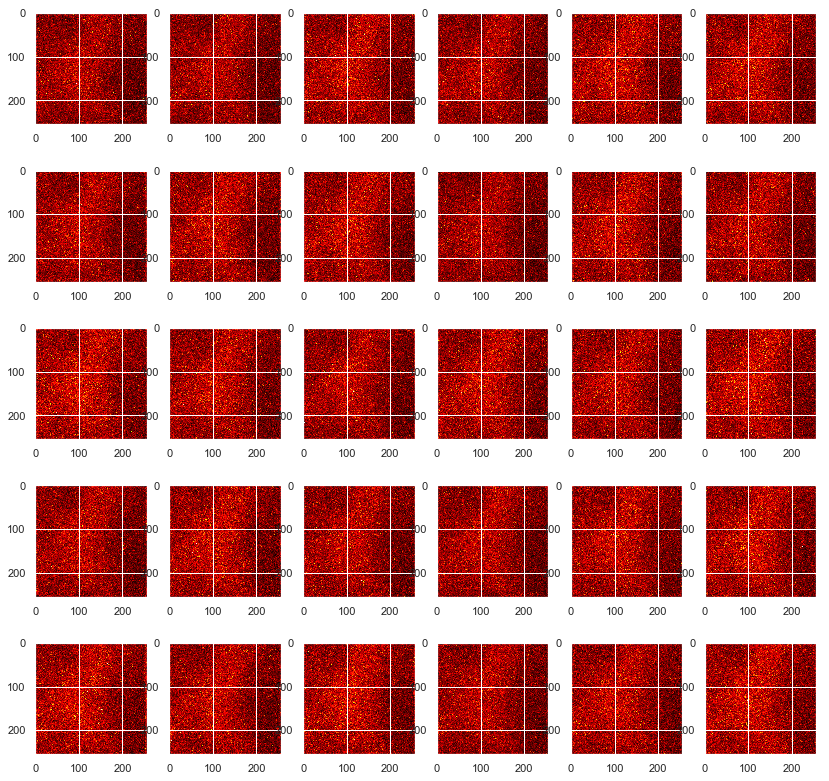

In [65]:
plot_LIVE_images(LDF8, nx=5, ny=6, figsize=(14,14))

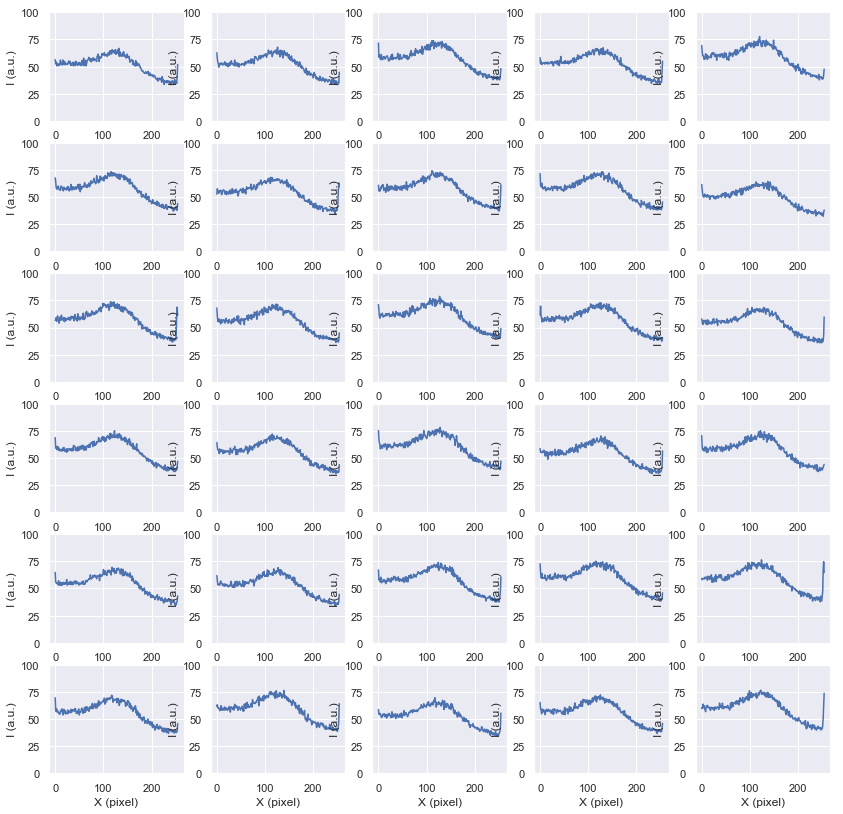

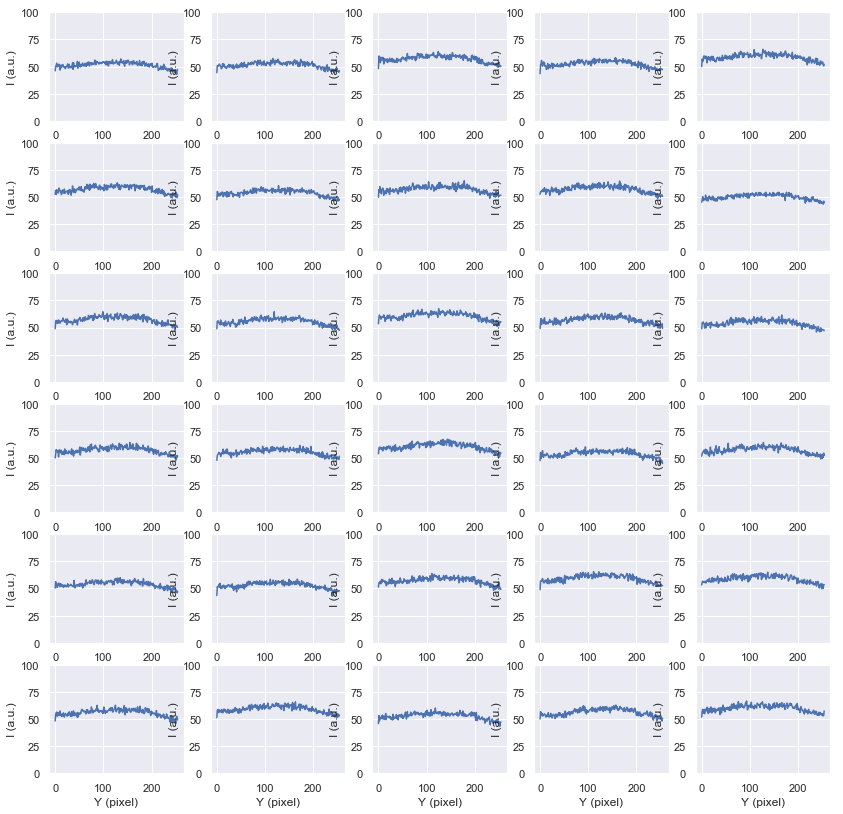

In [66]:
plot_LIVE_avg(LDF8, xpixel =(0, 255), ypixel = (0,255), imax=100, nx=6, ny=5, figsize=(14,14))

In [67]:
avg_ldf8= np.mean(avg_intensity(LDF8))
std_ldf8 = np.std(avg_intensity(LDF8))
print(f' average intensity per pixel = {avg_ldf8} +- {std_ldf8}')

 average intensity per pixel = 56.05481465657552 +- 2.7569302151673303


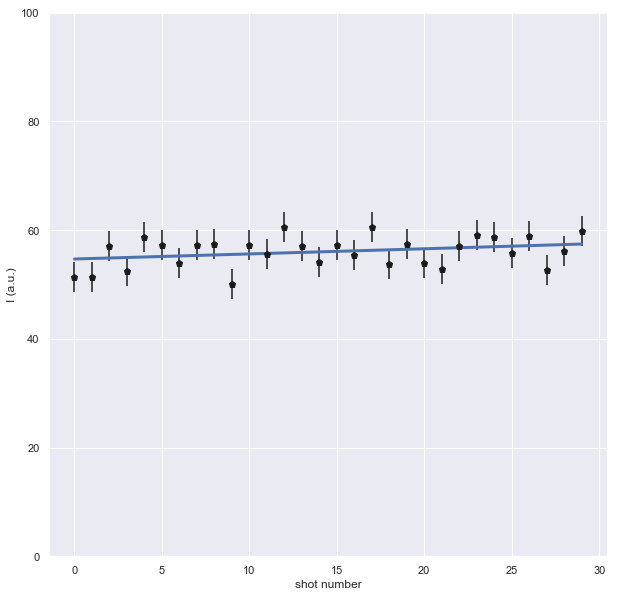

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a1ea0dd90>, values=array([ 54.69121187, 591.33914936]), errors=array([  0.97059385, 362.83410157]), chi2=0.9758951292617573, pvalue=0.5006037473721606, cov=array([[9.42052418e-01, 3.03769360e+02],
       [3.03769360e+02, 1.31648585e+05]]))


In [68]:
fit_df8, err_df8 = fit_intensity(LDF8, sigma=std_ldf8, imax=100, figsize=(10,10))

### LIVE 15 mW

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


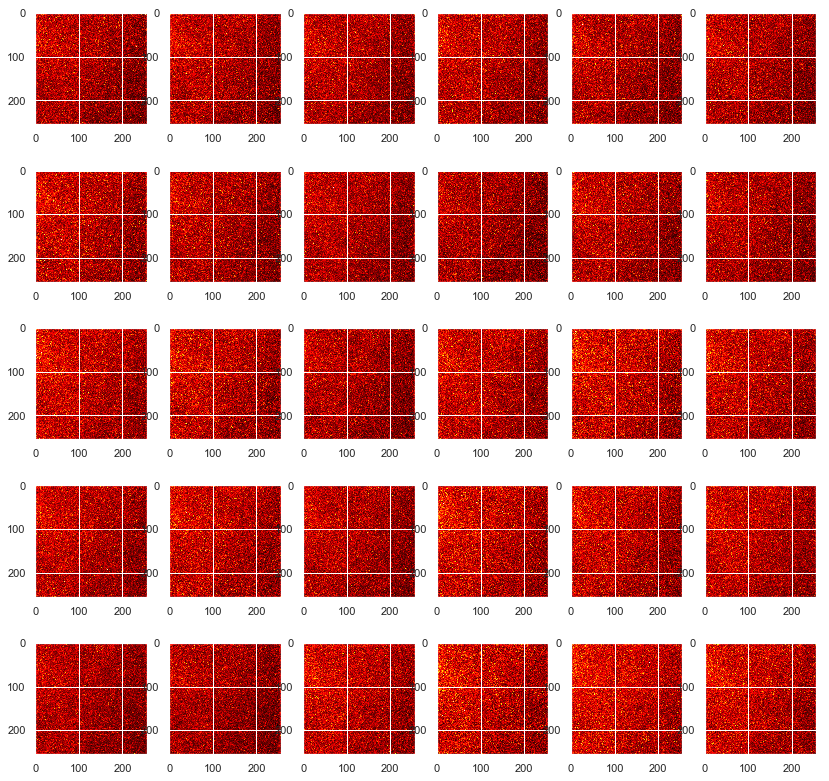

In [69]:
files  = glob.glob(LIVE['LIVE00_15mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF15   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF15, nx=5, ny=6, figsize=(14,14))

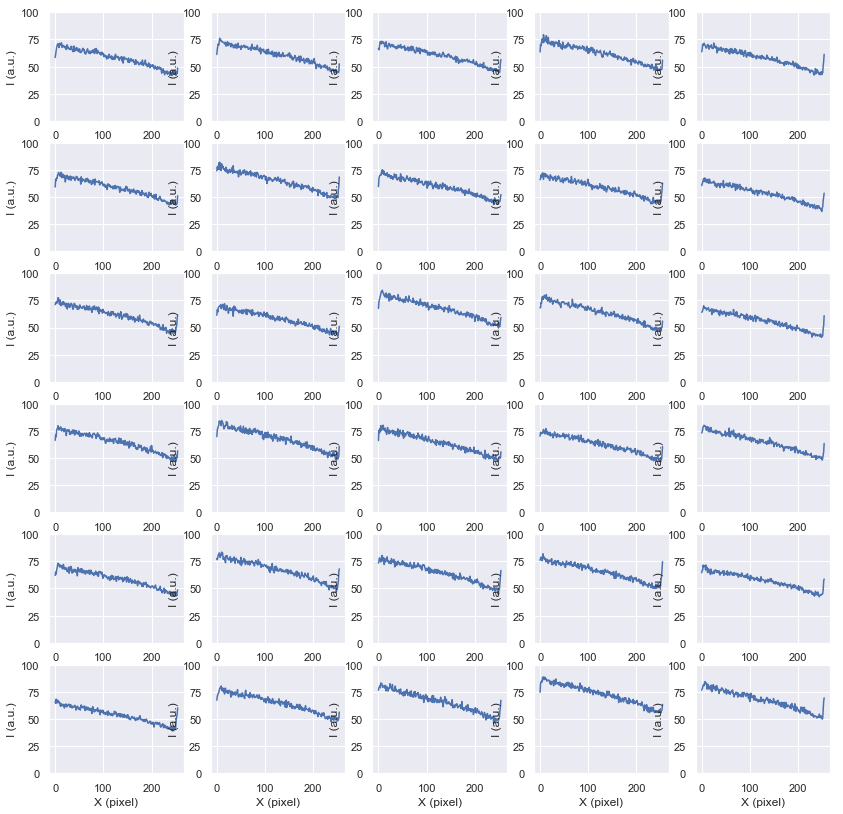

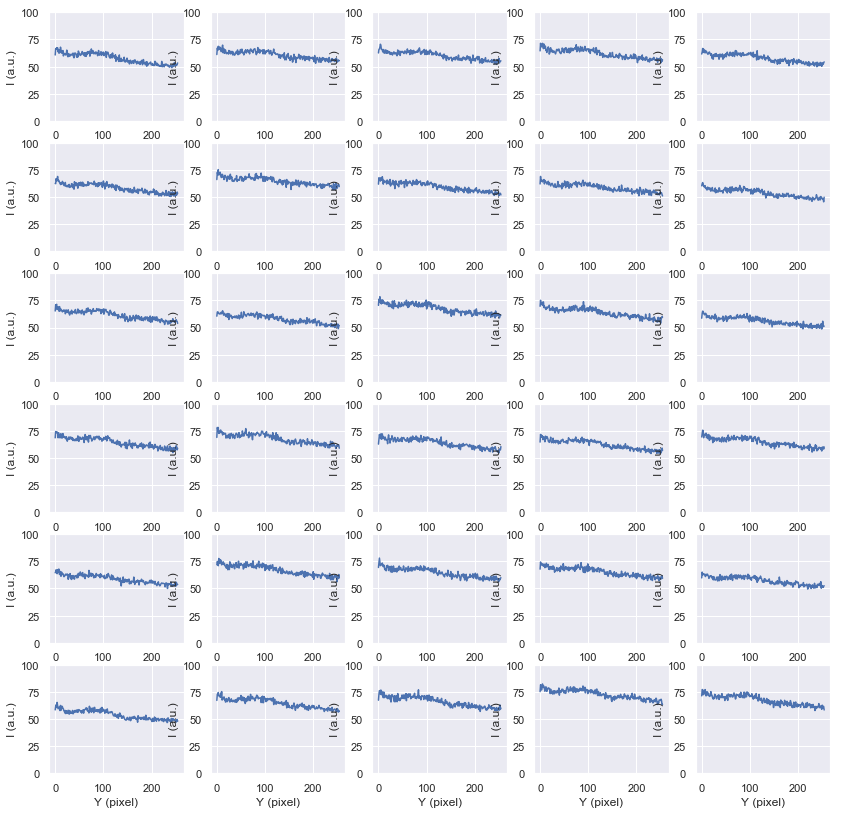

In [70]:
plot_LIVE_avg(LDF15, xpixel =(0, 255), ypixel = (0,255), imax=100, nx=6, ny=5, figsize=(14,14))

In [72]:
avg_ldf15= np.mean(avg_intensity(LDF15))
std_ldf15 = np.std(avg_intensity(LDF15))
print(f' average intensity per pixel = {avg_ldf15} +- {std_ldf15}')

 average intensity per pixel = 61.916788736979164 +- 4.424740230970791


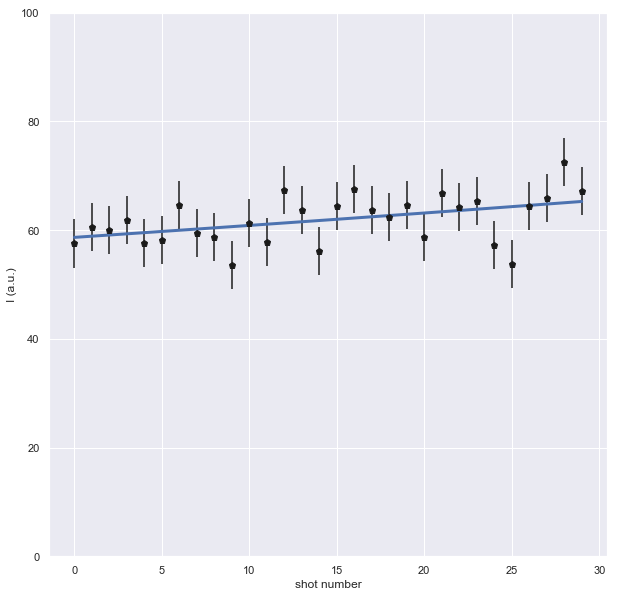

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a20c7d1e0>, values=array([ 58.67120999, 271.87512838]), errors=array([  1.53614792, 111.5007483 ]), chi2=0.859754425979677, pvalue=0.6776699631343791, cov=array([[2.35975044e+00, 1.48524468e+02],
       [1.48524468e+02, 1.24324169e+04]]))


In [87]:
fit_df15, err_df15 = fit_intensity(LDF15, sigma=std_ldf15, imax=100, figsize=(10,10))

### 18 mW

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


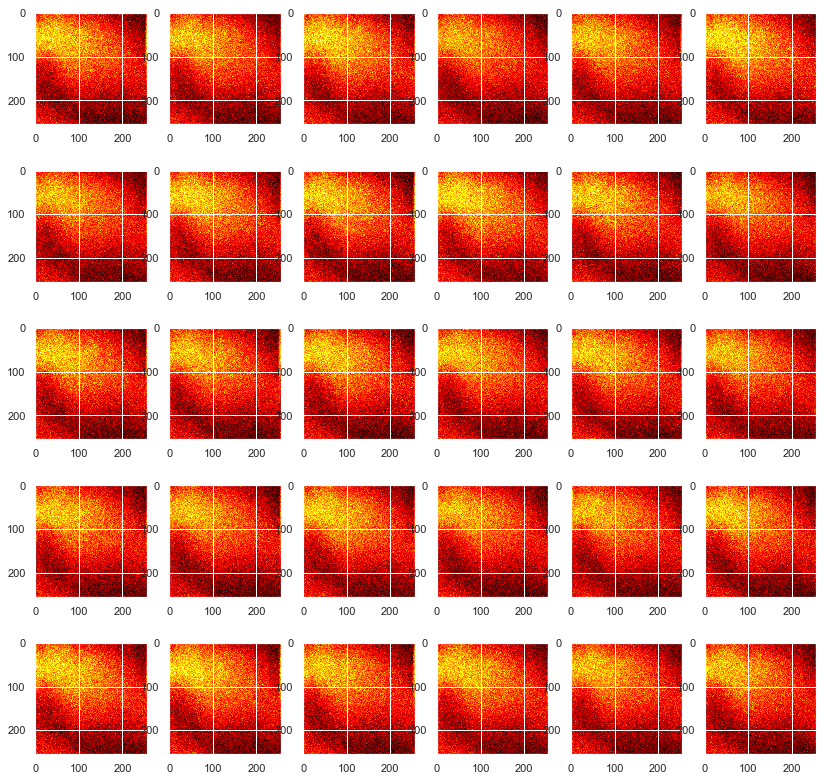

In [88]:
files  = glob.glob(LIVE['LIVE00_18mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF18   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF18, nx=5, ny=6, figsize=(14,14))

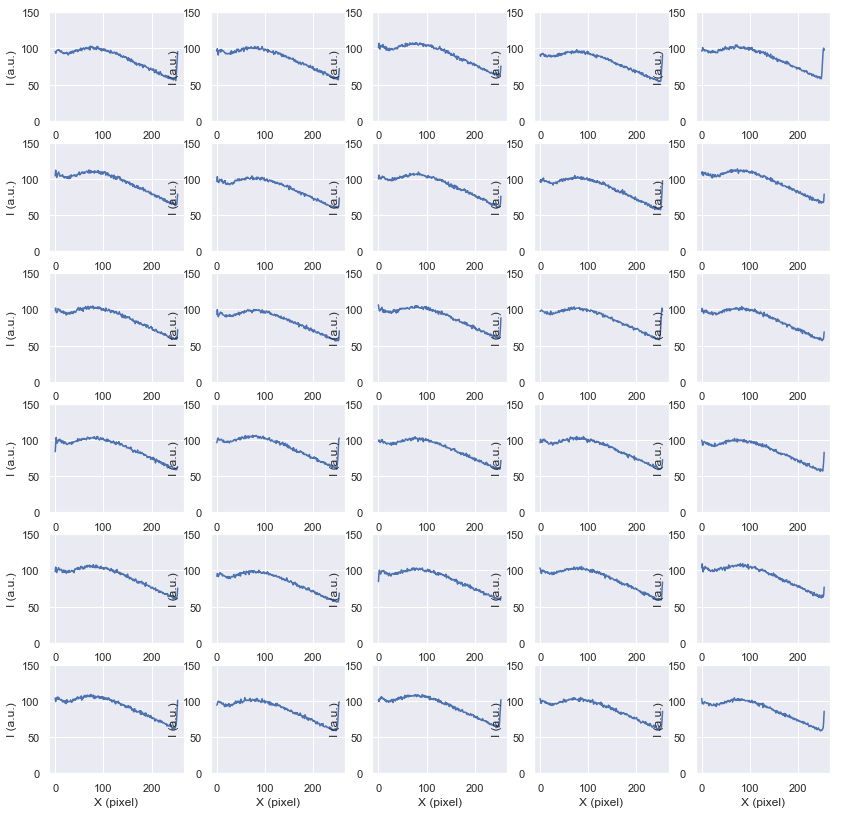

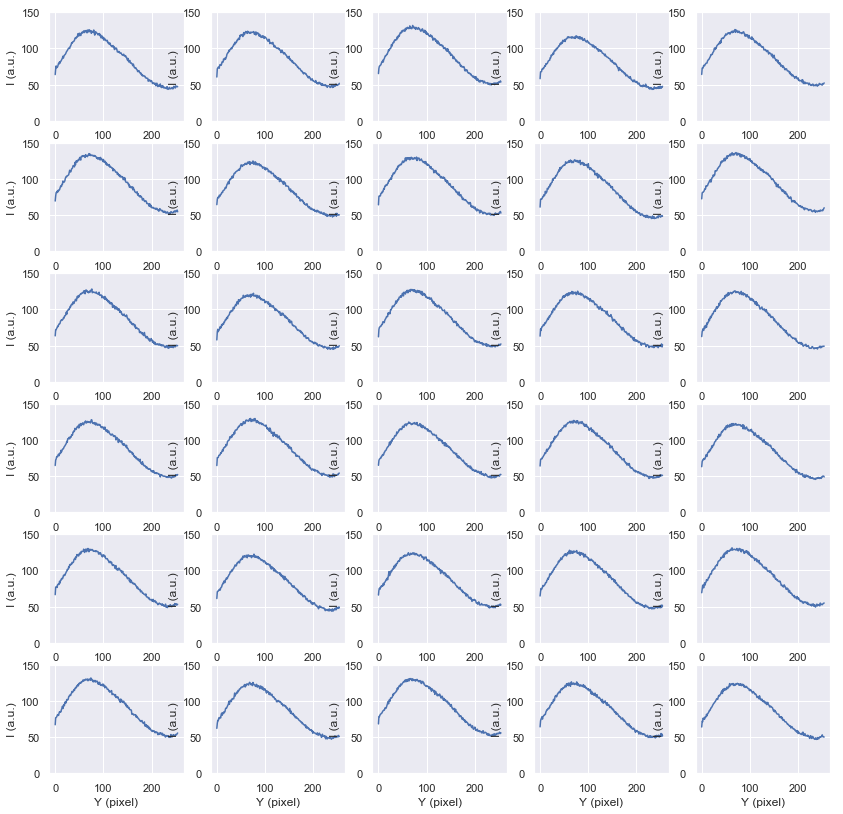

In [90]:
plot_LIVE_avg(LDF18, xpixel =(0, 255), ypixel = (0,255), imax=150, nx=6, ny=5, figsize=(14,14))

In [91]:
avg_ldf18= np.mean(avg_intensity(LDF18))
std_ldf18 = np.std(avg_intensity(LDF18))
print(f' average intensity per pixel = {avg_ldf18} +- {std_ldf18}')

 average intensity per pixel = 88.37693990071615 +- 3.092490249191958


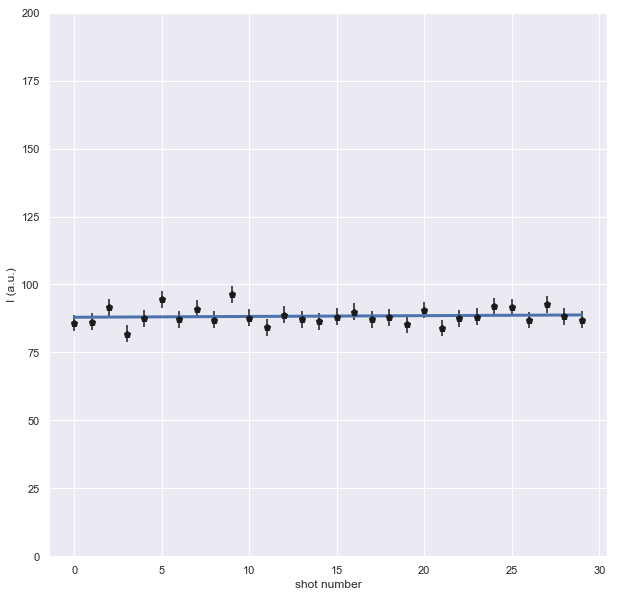

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a20c7de18>, values=array([  87.95227769, 3012.93696375]), errors=array([1.09904327e+00, 6.69976166e+03]), chi2=1.064207183186779, pvalue=0.3729481132846754, cov=array([[1.20789610e+00, 6.32824989e+03],
       [6.32824989e+03, 4.48868063e+07]]))


In [94]:
fit_df18, err_df18 = fit_intensity(LDF18, sigma=std_ldf18, imax=200, figsize=(10,10))

### 25 mW

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


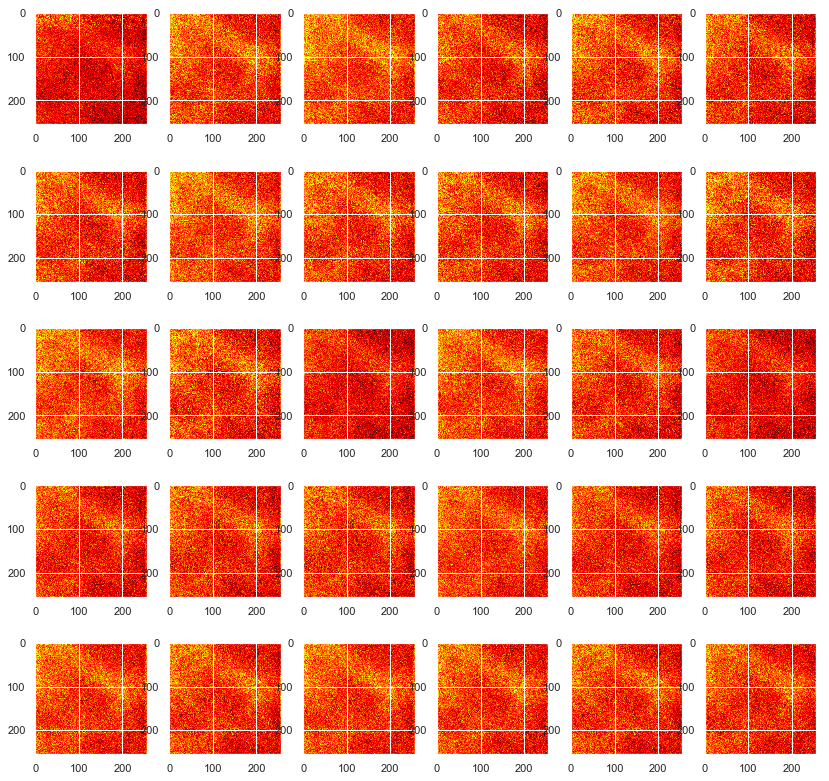

In [95]:
files  = glob.glob(LIVE['LIVE00_25mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF25   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF25, nx=5, ny=6, figsize=(14,14))

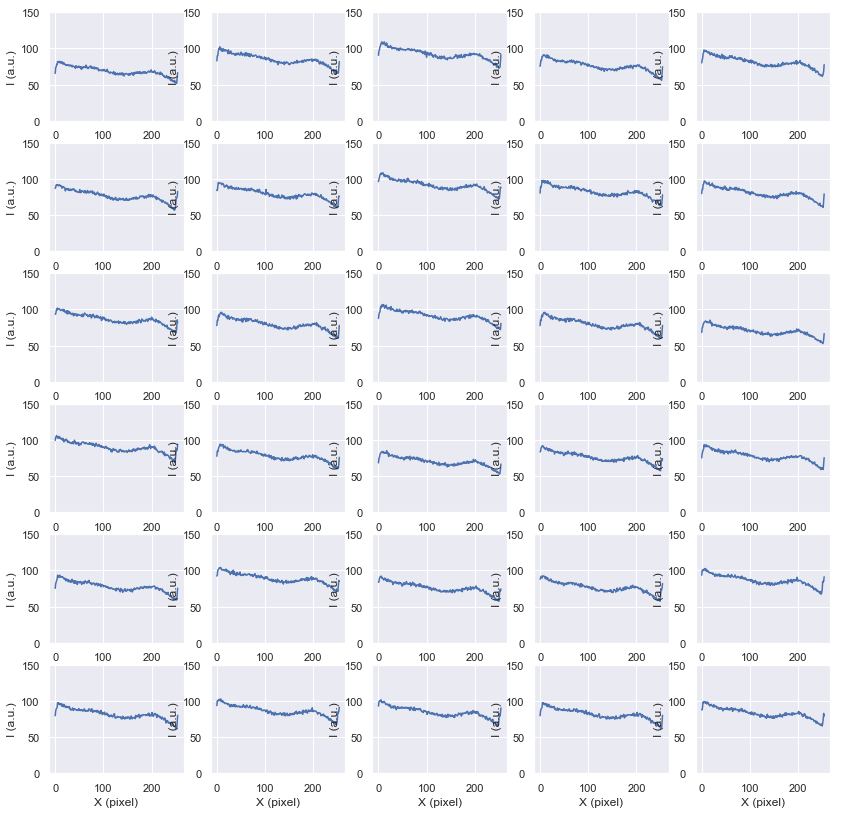

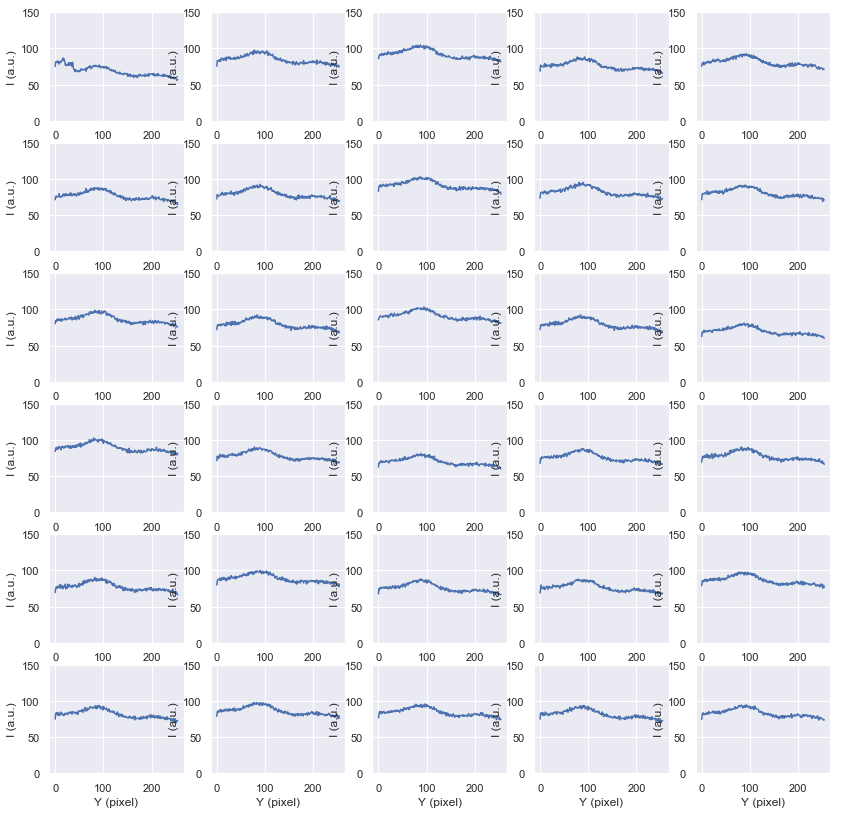

In [96]:
plot_LIVE_avg(LDF25, xpixel =(0, 255), ypixel = (0,255), imax=150, nx=6, ny=5, figsize=(14,14))

In [97]:
avg_ldf25= np.mean(avg_intensity(LDF25))
std_ldf25 = np.std(avg_intensity(LDF25))
print(f' average intensity per pixel = {avg_ldf25} +- {std_ldf25}')

 average intensity per pixel = 80.99728393554688 +- 6.126078536391595


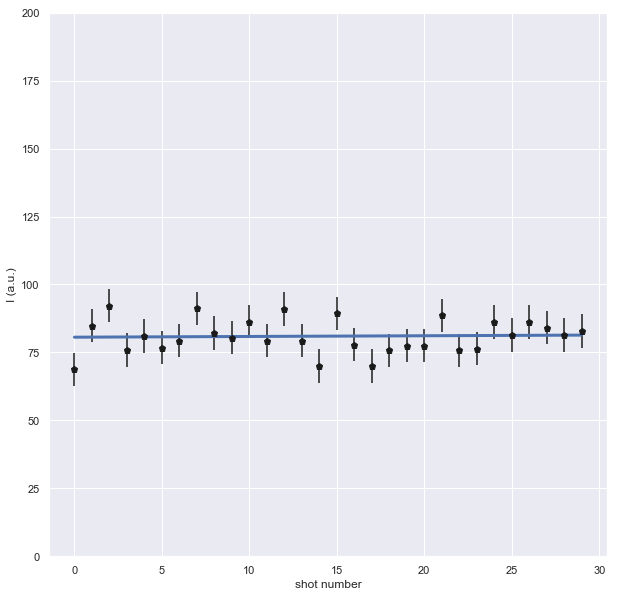

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a2127ee18>, values=array([  80.61538662, 3070.67111672]), errors=array([2.17724635e+00, 1.50428737e+04]), chi2=1.069948937011127, pvalue=0.36520105537507275, cov=array([[4.74040167e+00, 2.81475393e+04],
       [2.81475393e+04, 2.26288048e+08]]))


In [98]:
fit_df25, err_df25 = fit_intensity(LDF25, sigma=std_ldf25, imax=200, figsize=(10,10))

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


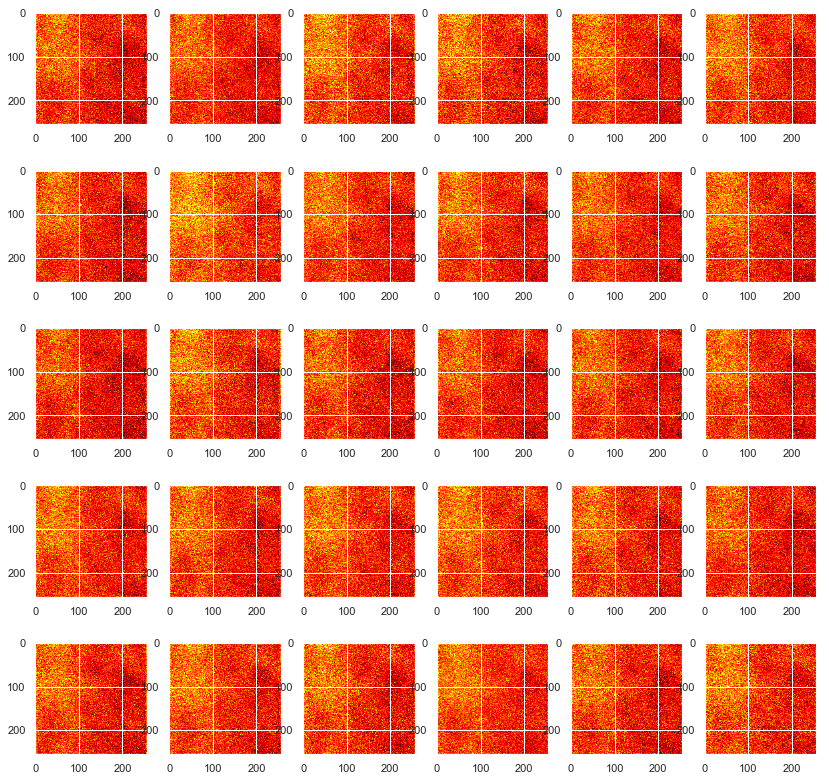

In [99]:
files  = glob.glob(LIVE['LIVE00_30mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF30   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF30, nx=5, ny=6, figsize=(14,14))

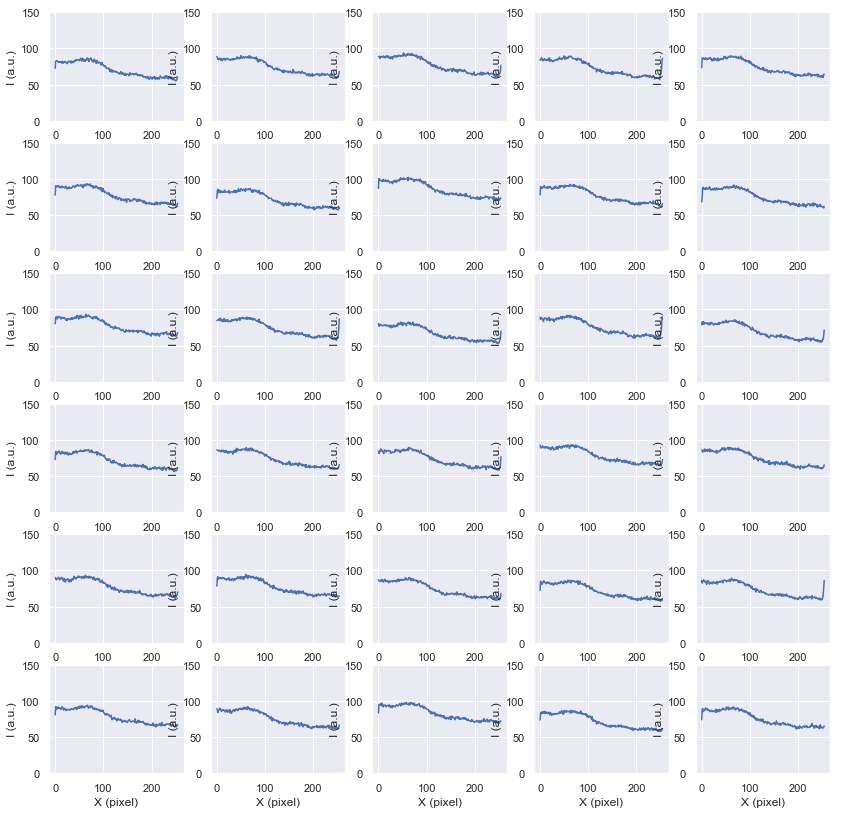

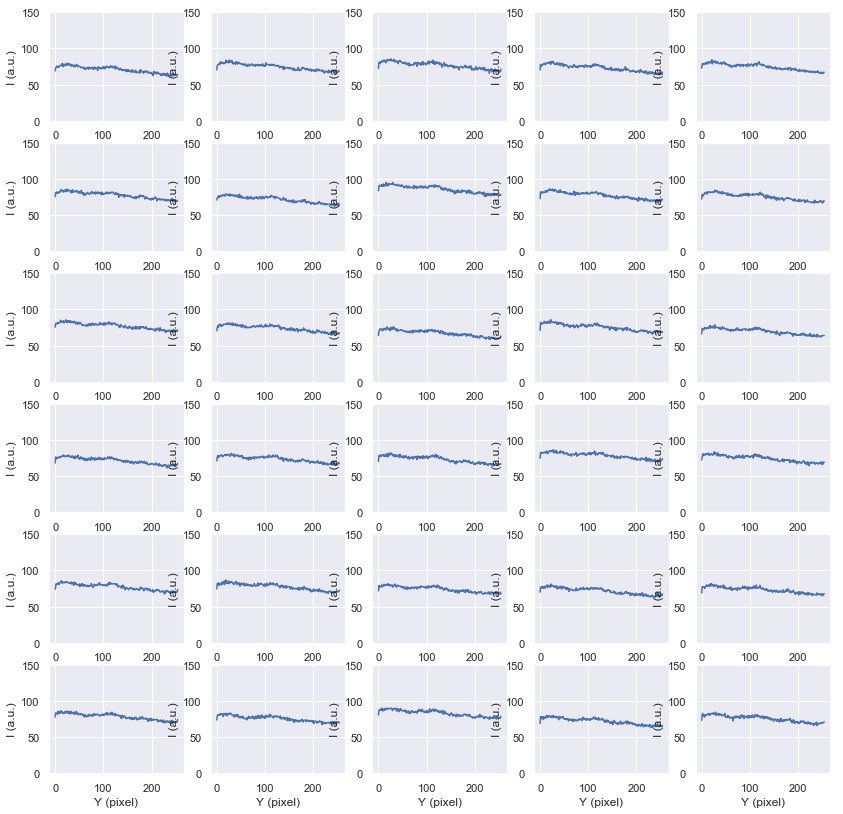

In [100]:
plot_LIVE_avg(LDF30, xpixel =(0, 255), ypixel = (0,255), imax=150, nx=6, ny=5, figsize=(14,14))

 average intensity per pixel = 74.92664642333985 +- 3.6368344020200025


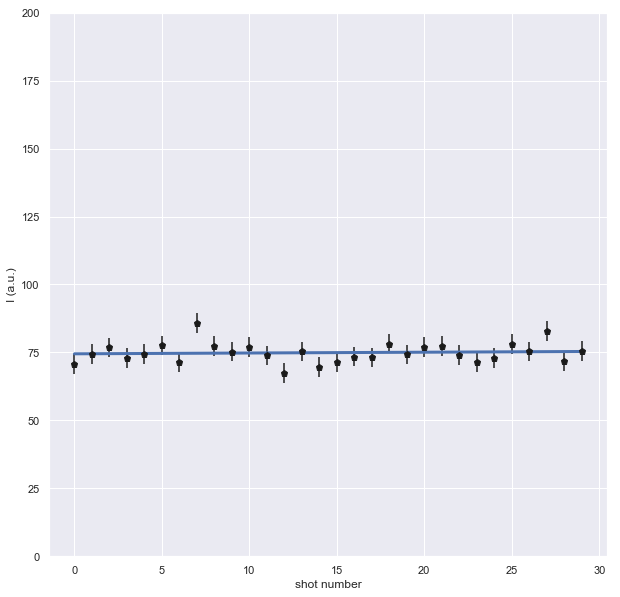

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a2069cae8>, values=array([  74.50022475, 2543.13242514]), errors=array([1.29195138e+00, 6.62163866e+03]), chi2=1.066181997358939, pvalue=0.3702744891223929, cov=array([[1.66913837e+00, 7.35348413e+03],
       [7.35348413e+03, 4.38460985e+07]]))


In [101]:
avg_ldf30 = np.mean(avg_intensity(LDF30))
std_ldf30 = np.std(avg_intensity(LDF30))
print(f' average intensity per pixel = {avg_ldf30} +- {std_ldf30}')
fit_df30, err_df30 = fit_intensity(LDF30, sigma=std_ldf30, imax=200, figsize=(10,10))

### 35

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


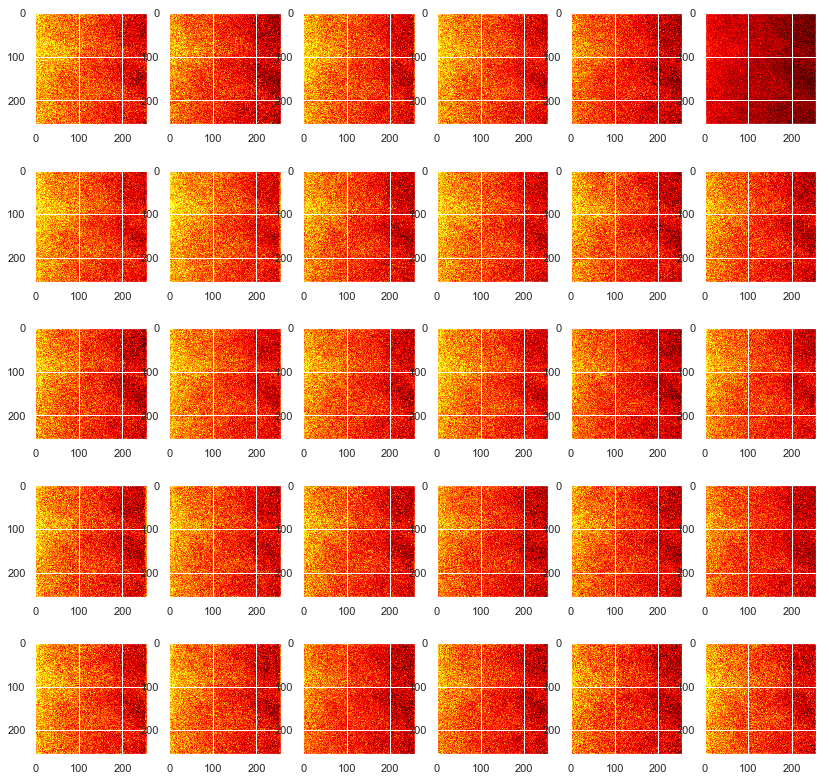

In [102]:
files  = glob.glob(LIVE['LIVE00_35mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF35   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF35, nx=5, ny=6, figsize=(14,14))

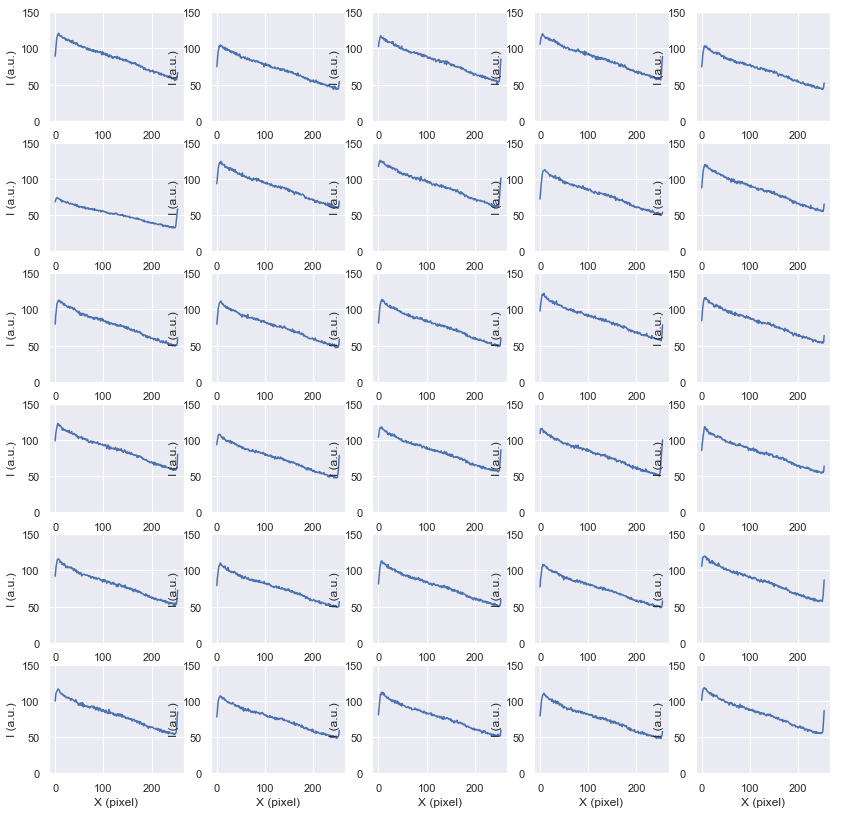

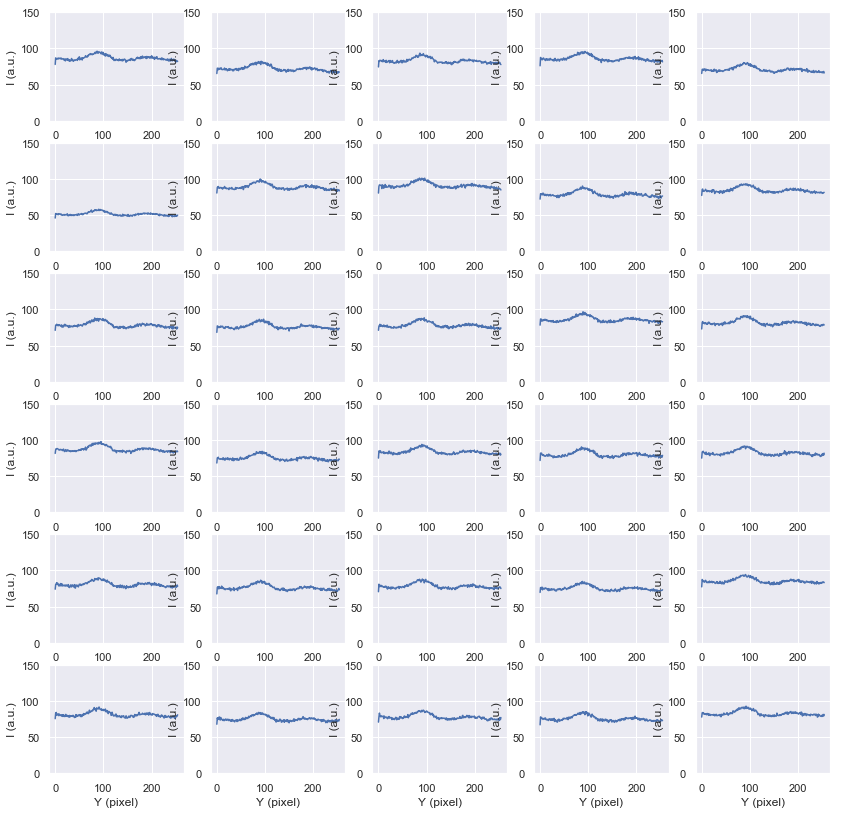

In [103]:
plot_LIVE_avg(LDF35, xpixel =(0, 255), ypixel = (0,255), imax=150, nx=6, ny=5, figsize=(14,14))

 average intensity per pixel = 79.63616536458333 +- 7.1637319180794465


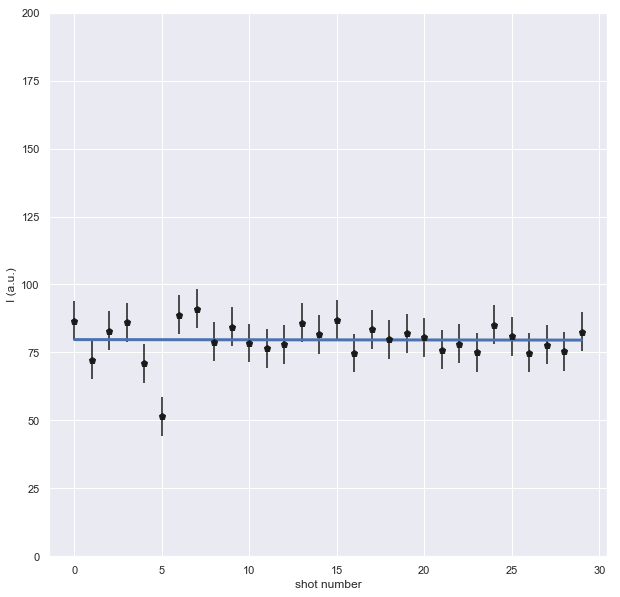

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a1ee1a2f0>, values=array([    79.72774182, -12614.0412492 ]), errors=array([2.55314402e+00, 3.00765300e+05]), chi2=1.0713657250102222, pvalue=0.3633019668503347, cov=array([[6.51854438e+00, 6.59215926e+05],
       [6.59215926e+05, 9.04597659e+10]]))


In [105]:
avg_ldf35 = np.mean(avg_intensity(LDF35))
std_ldf35 = np.std(avg_intensity(LDF35))
print(f' average intensity per pixel = {avg_ldf35} +- {std_ldf35}')
fit_df35, err_df35 = fit_intensity(LDF35, sigma=std_ldf35, imax=200, figsize=(10,10))

### 45

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


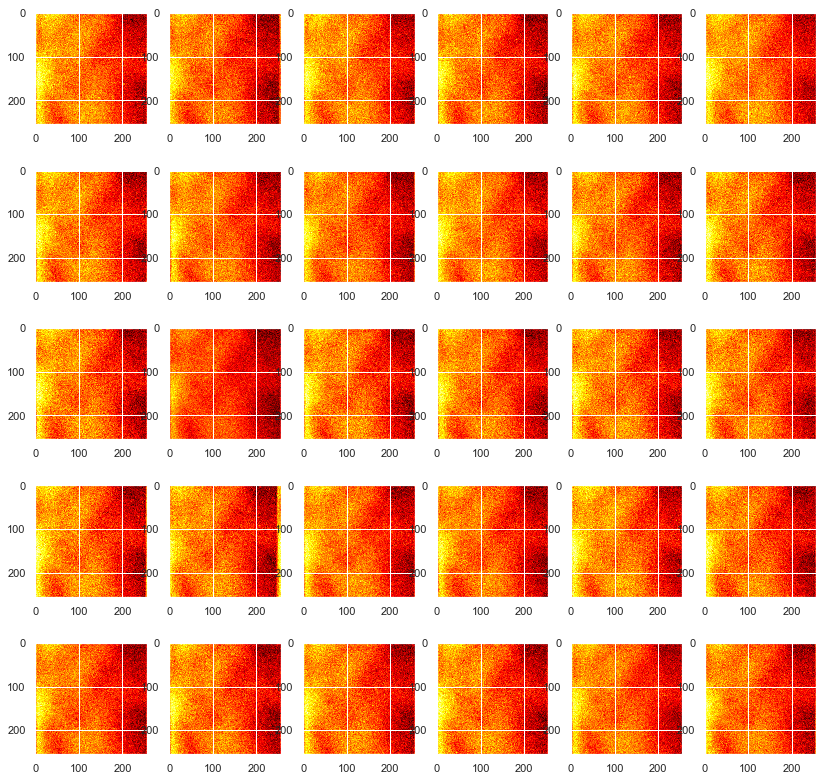

In [106]:
files  = glob.glob(LIVE['LIVE00_45mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF45   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF45, nx=5, ny=6, figsize=(14,14))

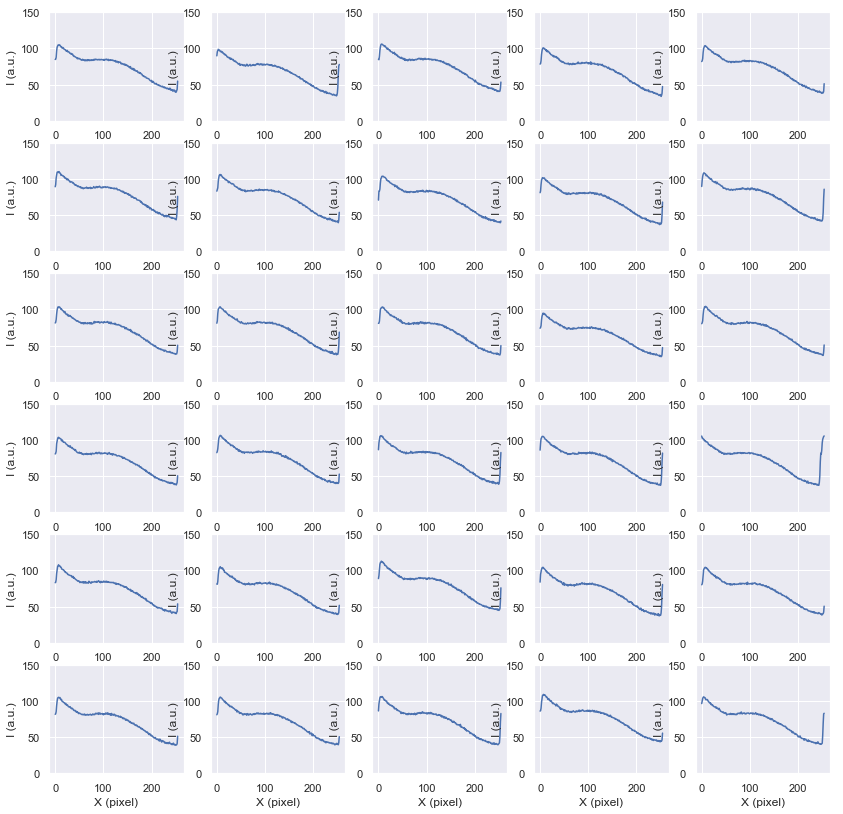

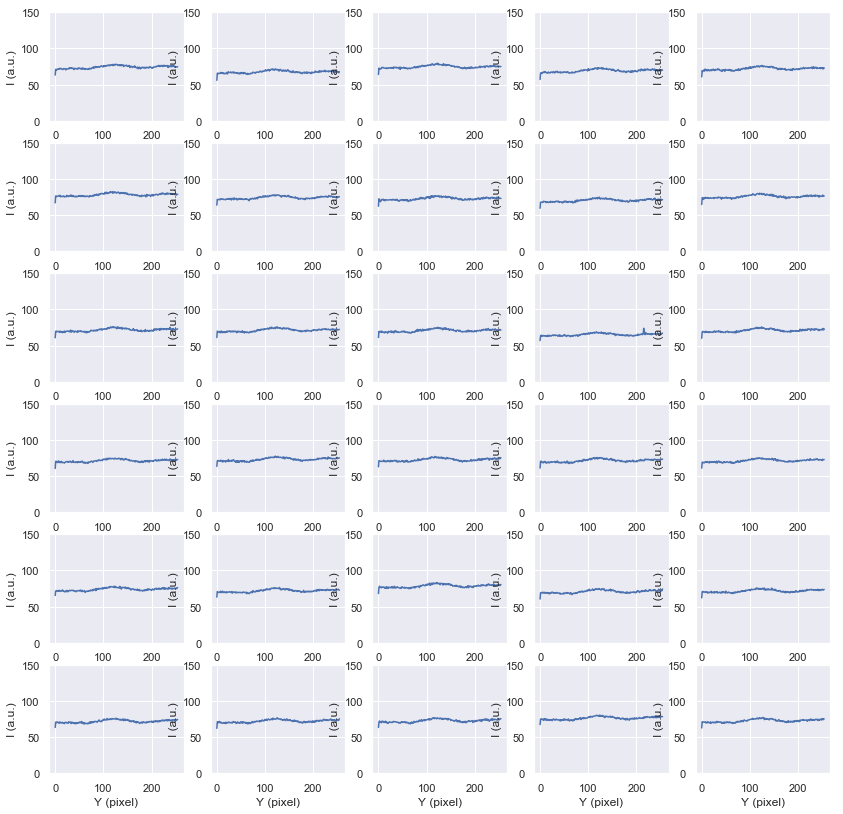

In [107]:
plot_LIVE_avg(LDF45, xpixel =(0, 255), ypixel = (0,255), imax=150, nx=6, ny=5, figsize=(14,14))

 average intensity per pixel = 72.29867858886719 +- 2.6456015512082978


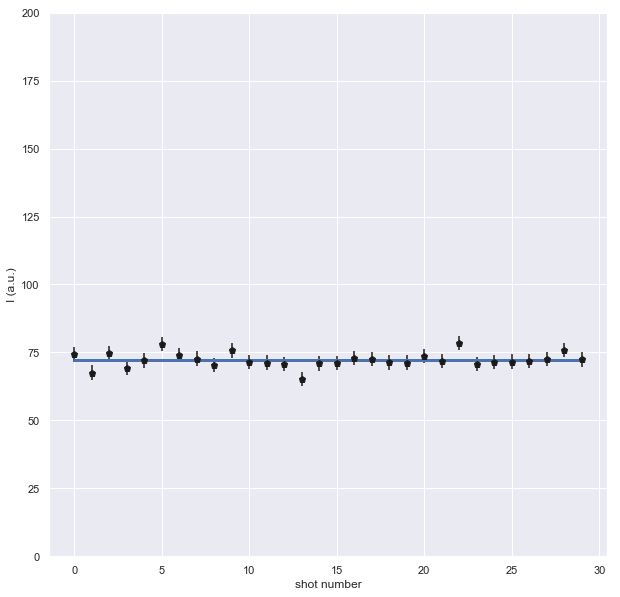

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a1ea09048>, values=array([ 7.22986797e+01, -9.18283627e+08]), errors=array([8.70721755e-01, 4.03030275e+14]), chi2=1.071428609704309, pvalue=0.36321779104758123, cov=array([[7.58156375e-01, 2.91981304e+14],
       [2.91981304e+14, 1.62433403e+29]]))


In [108]:
avg_ldf45 = np.mean(avg_intensity(LDF45))
std_ldf45 = np.std(avg_intensity(LDF45))
print(f' average intensity per pixel = {avg_ldf45} +- {std_ldf45}')
fit_df45, err_df45 = fit_intensity(LDF45, sigma=std_ldf45, imax=200, figsize=(10,10))

### 55 mW

Loading files corresponding to shots ['shot1', 'shot2', 'shot3', 'shot4', 'shot5', 'shot6', 'shot7', 'shot8', 'shot9', 'shot10', 'shot11', 'shot12', 'shot13', 'shot14', 'shot15', 'shot16', 'shot17', 'shot18', 'shot19', 'shot20', 'shot21', 'shot22', 'shot23', 'shot24', 'shot25', 'shot26', 'shot27', 'shot28', 'shot29', 'shot30']


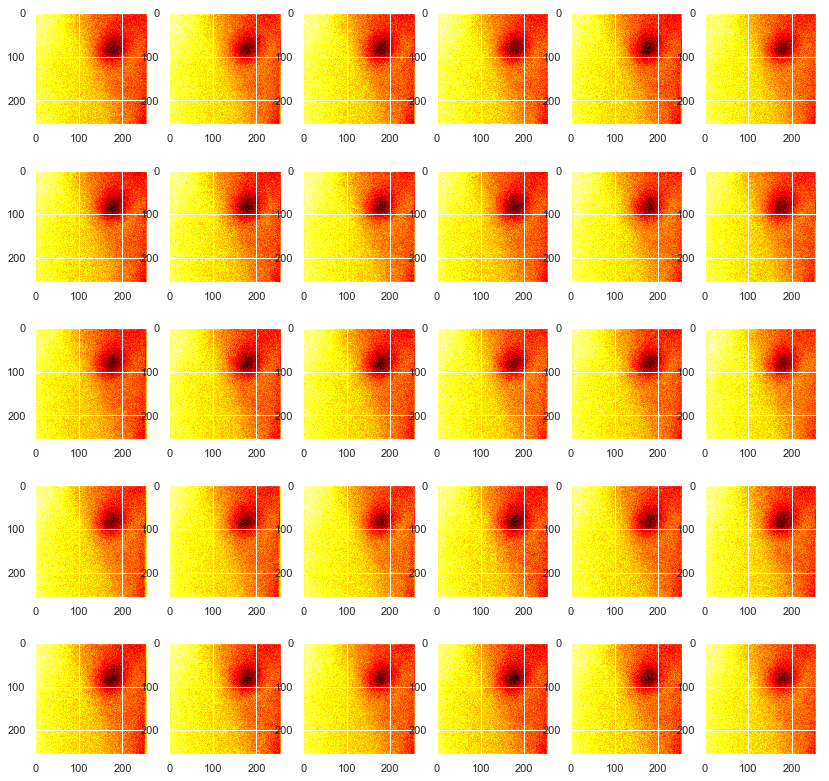

In [109]:
files  = glob.glob(LIVE['LIVE00_55mW_TPEF']+'/*.jpg')
sfiles = sort_files(files)
LDF55   = load_LIVE_images(sfiles)
plot_LIVE_images(LDF55, nx=5, ny=6, figsize=(14,14))

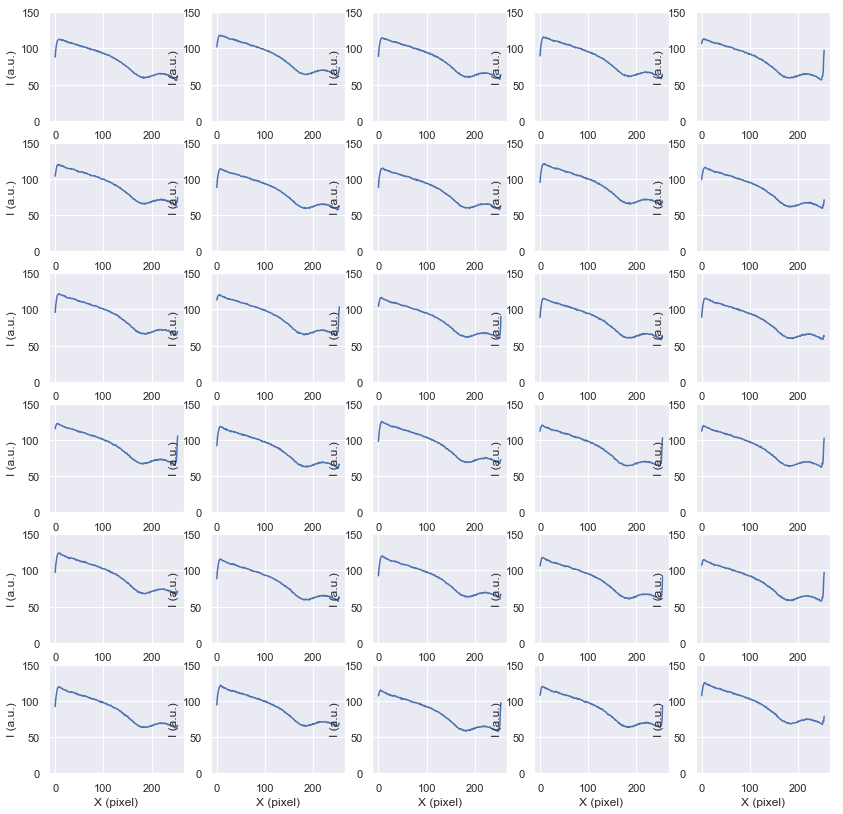

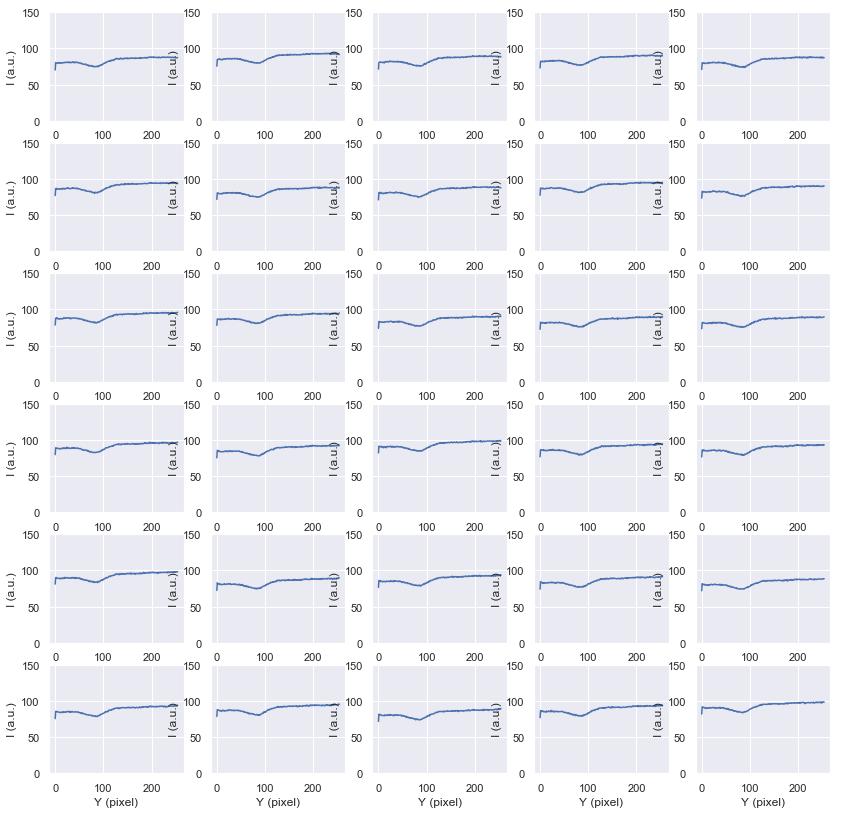

In [110]:
plot_LIVE_avg(LDF55, xpixel =(0, 255), ypixel = (0,255), imax=150, nx=6, ny=5, figsize=(14,14))

 average intensity per pixel = 87.10254974365235 +- 3.1217711606165435


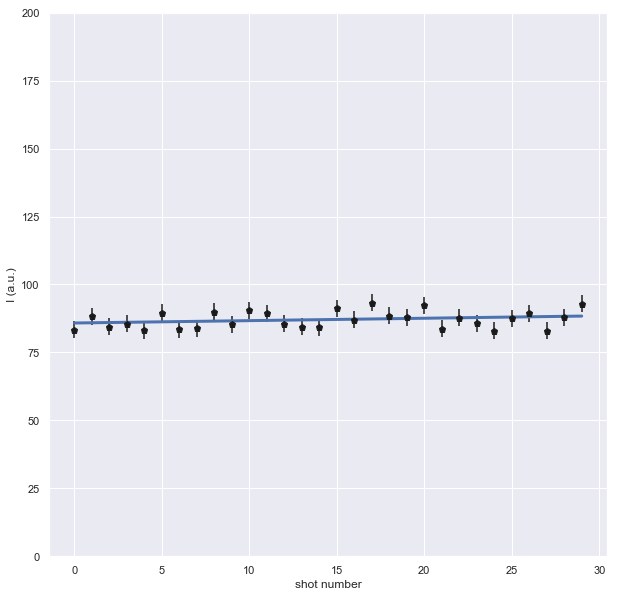

Fit function -->FitFunction(fn=<function fit.<locals>.<lambda> at 0x1a207041e0>, values=array([ 85.83570662, 992.2523838 ]), errors=array([  1.10427369, 744.34741607]), chi2=1.0076496221897076, pvalue=0.45314141753186626, cov=array([[1.21942039e+00, 7.07708357e+02],
       [7.07708357e+02, 5.54053076e+05]]))


In [111]:
avg_ldf55 = np.mean(avg_intensity(LDF55))
std_ldf55 = np.std(avg_intensity(LDF55))
print(f' average intensity per pixel = {avg_ldf55} +- {std_ldf55}')
fit_df55, err_df55 = fit_intensity(LDF55, sigma=std_ldf55, imax=200, figsize=(10,10))

In [112]:
fit_df55

array([ 85.83570662, 992.2523838 ])

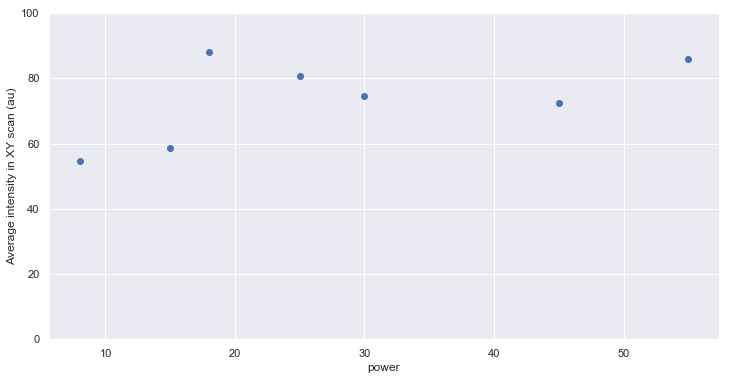

In [115]:
X = np.array([8,15,18,25,30,45,55])
Y = np.array([fit_df8[0],fit_df15[0],fit_df18[0],fit_df25[0],fit_df30[0],fit_df45[0],fit_df55[0]])
fig = plt.figure(figsize=(12,6))
ax  = fig.add_subplot(1, 1, 1)
    
plt.plot(X, Y, 'bo')
plt.ylim(0,100)
plt.xlabel('power')
plt.ylabel('Average intensity in XY scan (au)')

plt.show()

### Inconsistent

- Dependence with power in LIVE scans is inconsistent.
- No PB observed


        Pulsed Laser:
        wavelength                =8.0e+02 nm
        photon energy             =1.6e+00 eV
        power                     =1.3e+02 mW
        repetition rate           =7.6e+01 kHz
        pulse width               =4.0e+02 fs
        energy per pulse          =1.0e+04 fJ
        energy per second         =1.3e+02 mJ
        photons per second        =5.3e+17 ph/second
        

        name                 = JMB
        NA                   =   0.5
        M                    =  20.0
        eff dichroic         =  0.70
        eff filter           =  1.00
        eff PMT              =  0.10
        Optical transmission =  0.96
        Filter  transmission =  0.70
        Total transmission   =  0.07
        

        w0                   =   0.5 micron
        zr                   =   1.0 micron
        DOF                  =   2.0 micron
        
 Diffraction limit transverse size of beam = 0.9760000000000002
pixel size = 3.5e-01 mum
time per pixel =29.2

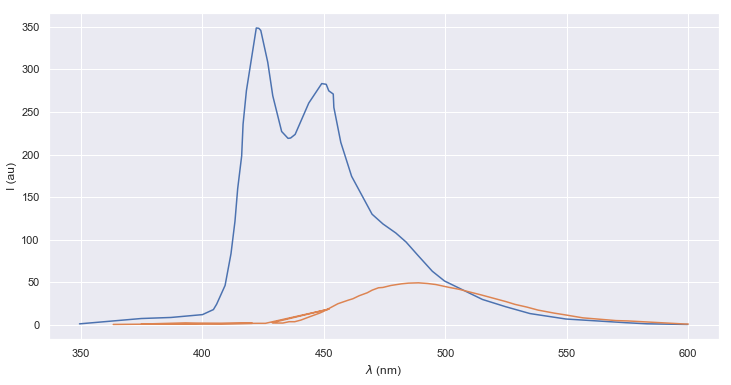

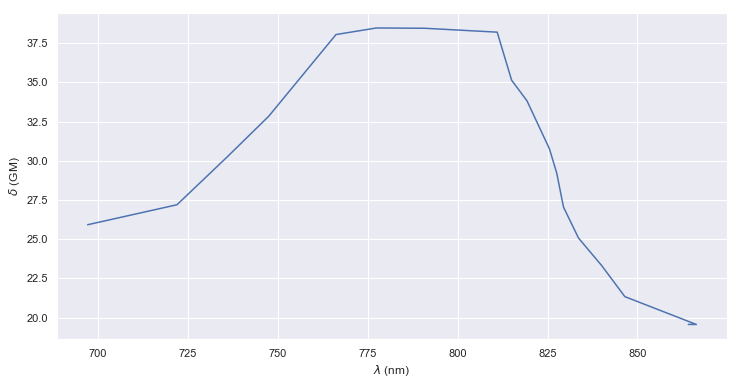

In [107]:
s3 = Setup(            setup_name             = 'Espinardo',
                        molecule_name          = 'FIB',
                        sample_name            = '2a',
                        sample_concentration   = 1E+6/6 * nanomole/liter,
                        laser_lambda           = 800 * nm,
                        laser_power            = 220 * mW,
                        laser_eff              = 0.6,
                        laser_lambda_eff       = 1,
                        laser_f                = 76  * megahertz,
                        laser_tau              = 400 * femtosecond,
                        mc_name                = 'JMB',
                        mc_NA                  = 0.5,
                        mc_M                   = 20,
                        mc_eff_dic             = 0.7,
                        mc_eff_filt            = 1.0,
                        mc_eff_PMT             = 0.1,
                        n_pixels               = 256,
                        scan_length            = 90 * mum,
                        v_per_line             = 40)

 Power (mW) = [0.33316341 0.43387766 0.49523981 0.51572099 0.54493213 0.56962981
 0.60989483 0.64204584]


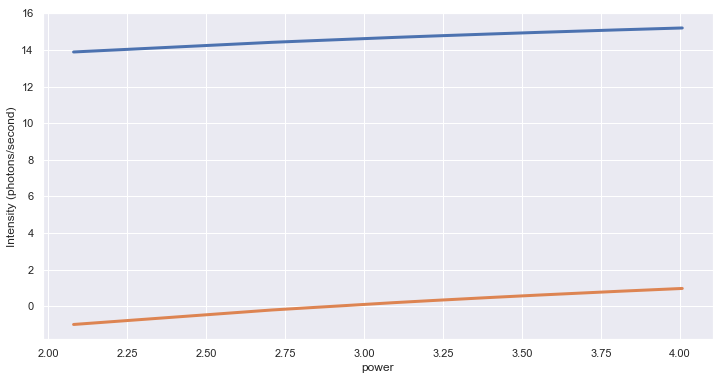

In [129]:
P = np.array([8.,15.,22.,25.,30.,35.,45.,55.]) * mW 
PP = np.log(P/mW)
print(f' Power (mW) = {PP/mW}')
S = [Setup(molecule_name= 'FIB', sample_name= '2a', sample_concentration= 1E+6/6 * nanomole/liter,
            laser_power = p, out ='quiet') for p in PP]
F2 = np.array([s.fluorescence(n_photons=2) for s in S])/us
F3 = np.array([s.fluorescence(n_photons=3) for s in S])/us
SF3 = [np.format_float_scientific(f, precision=2) for f in F3]

fig     = plt.figure(figsize=(12,6))
ax      = fig.add_subplot(1, 1, 1)
#za      = np.polyfit(X, np.log(Ib), 1)
#print(f'coefficients of poly fit: {za}')
#fa      = np.poly1d(za)
#ffa     = fitf.fit(fitf.polynom, X, Ia, seed=za, sigma= np.array(sigmb))
#plt.errorbar(X ,Ia, yerr = sigma, fmt="p", ms=7, ls='none')
#plt.errorbar(X ,np.log(Ib), yerr = np.log(sigmb)/10, fmt="p", ms=7, ls='none')
plt.plot(PP, np.log(F2), lw=3)
plt.plot(PP, np.log(F3), lw=3)
#plt.plot(X, ffa.fn(X), lw=3)
plt.xlabel('power')
plt.ylabel('Intensity (photons/second)')
plt.show()


In [108]:
avg_l0 = 121
F = s3.fluorescence(n_photons=3)
nf = s3.photons_per_pixel(n_photons=3)
pnm = s3.photons_per_pixel_per_molecule(n_photons=3)
nd = s3.detected_photons_per_pixel(n_photons=3)
IN = avg_l0 / nd
print(f' F = {F/us:5.1e}  photons/second')
print(f' nf = {nf:5.1e} photons/pixel (about 30 mus)')
print(f' nm = {pnm:5.1e} photons/pixel/molecule (about 30 mus)')
print(f' nd = {nd:5.1e} detected photons/pixel (about 30 mus)')
print(f' number of photons per count = {IN:5.1e} ')

 F = 2.3e+07  photons/second
 nf = 6.7e+02 photons/pixel (about 30 mus)
 nm = 4.0e-03 photons/pixel/molecule (about 30 mus)
 nd = 4.5e+01 detected photons/pixel (about 30 mus)
 number of photons per count = 2.7e+00 
